# Visualizing Data by Segment of Footprint

In [1]:
import warnings
warnings.filterwarnings("ignore") # suppress warnings

In [2]:
import os
import sys
import h5py
import laspy
import pyproj
import datetime 
import rasterio
import numpy as np
import pandas as pd
import geopandas as gpd
import contextily as ctx  # For adding a basemap
from rasterio.mask import mask
from rasterio.plot import show
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
import matplotlib.patches as patches
from scipy.interpolate import griddata
from shapely.geometry import Point, box
from rasterio.warp import reproject, Resampling
from geoviews import opts, tile_sources as gvts
from matplotlib.patches import Circle, Polygon
from matplotlib.collections import PatchCollection
from shapely.geometry import Polygon as ShpPolygon

plt.style.use("~/geoscience/carbon_estimation/MNRAS.mplstyle")
%matplotlib inline

In [3]:
function_path = os.path.expanduser("~/geoscience/carbon_estimation/code/functions")
sys.path.append(function_path)

# Check the default PROJ data directory
print(pyproj.datadir.get_data_dir())

/bsuscratch/tnde/miniforge3/envs/veg_height/share/proj


## Loading ICESat2 Data

In [4]:
from helper_functions import load_icesat2_data
projected_crs = "epsg:6340" 
icesat2_file = "icesat2_ml2.geojson"
icesat2_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/"
atl08 = icesat2_dir+f'{icesat2_file}'
atl08

'/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/icesat2_ml2.geojson'

In [5]:
%%time
icesat2_gdf_atl08 = load_icesat2_data(atl08, "ATL08", process = False)
icesat2_gdf_atl08 = icesat2_gdf_atl08[icesat2_gdf_atl08["gnd_ph_count"] != 0]
icesat2_gdf_atl08 = icesat2_gdf_atl08[icesat2_gdf_atl08["h_canopy"] <= 15]
icesat2_gdf_atl08 = icesat2_gdf_atl08.rename(columns={"elevation_NAVD88_icesat2_from_crs": "Elevation"})
print(f"Length of data: {len(icesat2_gdf_atl08)}")
print(icesat2_gdf_atl08.crs, "\n")
icesat2_gdf_atl08.crs

Length of data: 30537
EPSG:6340 

CPU times: user 2.79 s, sys: 2.62 ms, total: 2.79 s
Wall time: 3.57 s


<Projected CRS: EPSG:6340>
Name: NAD83(2011) / UTM zone 11N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United States (USA) - between 120°W and 114°W onshore and offshore - California, Idaho, Nevada, Oregon, Washington.
- bounds: (-120.0, 30.88, -114.0, 49.01)
Coordinate Operation:
- name: UTM zone 11N
- method: Transverse Mercator
Datum: NAD83 (National Spatial Reference System 2011)
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [6]:
icesat2_gdf_atl08.columns

Index(['time', 'x_atc', 'h_min_canopy', 'h_te_median', 'gt', 'spot', 'rgt',
       'gnd_ph_count', 'h_mean_canopy', 'h_canopy', 'h_max_canopy',
       'snowcover', 'ph_count', 'canopy_h_metrics', 'solar_elevation_x',
       'segment_id', 'veg_ph_count', 'landcover', 'extent_id',
       'canopy_openness', 'cycle', 'num_bins', 'binsize', 'waveform',
       'pce_mframe_cnt', 'solar_elevation_y', 'h_dif_ref', 'Longitude',
       'Latitude', 'Easting', 'Northing', 'elevation_NAVD88_icesat2_from_pipe',
       'Elevation', 'Date', 'date', 'geometry'],
      dtype='object')

In [7]:
# Print the first few rows of the subset data
print(f"Length of data: {len(icesat2_gdf_atl08)}")
print(icesat2_gdf_atl08.head())

Length of data: 30537
                     time       x_atc  h_min_canopy  h_te_median  gt  spot  \
0 2019-05-01 02:00:18.797  15261785.0      0.518799    1669.7802  10     1   
1 2019-05-01 02:00:18.808  15261861.0      0.620728    1673.5652  10     1   
3 2019-05-01 02:00:18.837  15262066.0      1.146484    1718.3307  10     1   
4 2019-05-01 02:00:18.849  15262149.0      0.557983    1720.0553  10     1   
5 2019-05-01 02:00:18.864  15262262.0      0.520020    1719.2477  10     1   

   rgt  gnd_ph_count  h_mean_canopy  h_canopy  ...  h_dif_ref   Longitude  \
0  501            21       1.062189  3.419067  ...  -4.134033 -116.847629   
1  501            40       1.759356  5.692627  ...  -7.536011 -116.847721   
3  501             7       4.224749  8.523682  ...   0.887329 -116.847964   
4  501            21       1.534317  3.273193  ...   0.887329 -116.848063   
5  501            42       1.283726  3.224731  ...  -2.612915 -116.848200   

    Latitude        Easting      Northing  ele

In [8]:
# Convert the 'date' column to datetime format and keep only the date part (YYYY-MM-DD)
icesat2_gdf_atl08["date"] = pd.to_datetime(icesat2_gdf_atl08["time"]).dt.strftime("%Y-%m-%d")
# Print the first few rows to verify
icesat2_gdf_atl08#.head()

,time,x_atc,h_min_canopy,h_te_median,gt,spot,rgt,gnd_ph_count,h_mean_canopy,h_canopy,...,h_dif_ref,Longitude,Latitude,Easting,Northing,elevation_NAVD88_icesat2_from_pipe,Elevation,Date,date,geometry
0,2019-05-01 02:00:18.797,15261785.0,0.518799,1669.7802,10,1,501,21,1.062189,3.419067,...,-4.134033,-116.847629,43.208991,512378.580431,4.784034e+06,1686.422704,1686.967398,2019-05-01 02:00:18.797,2019-05-01,POINT (512378.58 4784034.098)
1,2019-05-01 02:00:18.808,15261861.0,0.620728,1673.5652,10,1,501,40,1.759356,5.692627,...,-7.536011,-116.847721,43.208309,512371.297938,4.783958e+06,1690.205964,1690.750670,2019-05-01 02:00:18.808,2019-05-01,POINT (512371.298 4783958.308)
3,2019-05-01 02:00:18.837,15262066.0,1.146484,1718.3307,10,1,501,7,4.224749,8.523682,...,0.887329,-116.847964,43.206469,512351.895277,4.783754e+06,1734.966712,1735.511452,2019-05-01 02:00:18.837,2019-05-01,POINT (512351.895 4783753.969)
4,2019-05-01 02:00:18.849,15262149.0,0.557983,1720.0553,10,1,501,21,1.534317,3.273193,...,0.887329,-116.848063,43.205731,512344.028471,4.783672e+06,1736.689424,1737.234177,2019-05-01 02:00:18.849,2019-05-01,POINT (512344.028 4783672.001)
5,2019-05-01 02:00:18.864,15262262.0,0.520020,1719.2477,10,1,501,42,1.283726,3.224731,...,-2.612915,-116.848200,43.204718,512333.050720,4.783559e+06,1735.879210,1736.423982,2019-05-01 02:00:18.864,2019-05-01,POINT (512333.051 4783559.417)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34858,2024-10-19 02:34:51.121,15277260.0,0.568359,2071.9326,40,4,501,28,0.809455,1.340088,...,-2.014404,-116.759182,43.062749,519609.988519,4.767811e+06,2088.240554,2088.790431,2024-10-19 02:34:51.121,2024-10-19,POINT (519609.989 4767810.616)
34859,2024-10-19 02:34:51.132,15277456.0,0.541992,2058.4739,60,6,501,29,1.678144,5.248047,...,-3.049316,-116.798951,43.063809,516371.443271,4.767920e+06,2074.762686,2075.311645,2024-10-19 02:34:51.132,2024-10-19,POINT (516371.443 4767919.805)
34860,2024-10-19 02:34:51.147,15277565.0,0.680908,2064.4272,60,6,501,32,1.333686,2.389404,...,-2.347168,-116.799081,43.062839,516361.143401,4.767812e+06,2080.716638,2081.265614,2024-10-19 02:34:51.147,2024-10-19,POINT (516361.143 4767812.115)
34861,2024-10-19 02:34:51.160,15277656.0,0.653320,2071.3079,60,6,501,37,2.127057,4.461914,...,-2.347168,-116.799197,43.062024,516351.942851,4.767722e+06,2087.597749,2088.146740,2024-10-19 02:34:51.160,2024-10-19,POINT (516351.943 4767721.521)


## Loading GEDI Data

In [9]:
drop_cols = ["shot_number", "Latitude_l2a", "Longitude_l2a", 
             "rh_85", "rh_90", "rh_98", "rh_99", "GEDI02_A_slope_ratio_utm", 
             "GEDI02_A_slope_rise_run", "cover_z_10", "cover_z_15", "cover_z_20", 
             "cover_z_25", "cover_z_27", "cover_z_28", "pai_z_10", "pai_z_15", 
             "pai_z_20", "pai_z_25", "pai_z_27", "pai_z_28", "pavd_z_10", 
             "pavd_z_15", "pavd_z_20", "pavd_z_25", "pavd_z_27", "pavd_z_28", "rh100", "geometry"]

In [10]:
target_col = "rh_100" # "rh_80"
gedi_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/"
gedi_file = "gedi_ml2.geojson"
gedi_data = gpd.read_file(os.path.join(gedi_dir, gedi_file))
bbox_gedi = np.min(gedi_data["Easting_l2a"]), np.min(gedi_data["Northing_l2a"]), np.max(gedi_data["Easting_l2a"]), np.max(gedi_data["Northing_l2a"])
# x_min, y_min, x_max, y_max = list(bbox_gedi)
gedi_data = gedi_data.drop(drop_cols, axis = 1)
gedi_data = gedi_data[gedi_data["fhd_normal"] != -9999.000000]
gedi_data = gedi_data[gedi_data[target_col] <= 15]
gedi_data.head()

,date,BEAM_l2a,quality_flag,num_detectedmodes,rh_80,rh_95,rh_100,sensitivity,solar_elevation,Easting_l2a,Northing_l2a,elevation_NAVD88_gedi_from_crs_l2a,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29
0,2019-07-23 02:29:57,BEAM1011,1,1,1.08,2.21,4.04,0.976120,1.137563,513688.964915,4.795170e+06,1815.427281,0.996506,755.0,0.0,1.417535,-0.0,-0.0
1,2019-07-23 02:29:57,BEAM1011,1,1,0.97,1.94,3.63,0.975038,1.137287,513736.570004,4.795201e+06,1815.428389,0.001113,749.0,0.0,1.340707,-0.0,-0.0
2,2019-07-23 02:29:57,BEAM1011,1,1,1.12,2.43,4.90,0.976903,1.137010,513784.205063,4.795233e+06,1814.398598,-1.034706,766.0,0.0,1.658798,-0.0,-0.0
3,2019-07-23 02:29:57,BEAM1011,1,1,0.93,1.91,3.59,0.971373,1.136734,513831.832065,4.795264e+06,1813.271707,-1.132363,745.0,0.0,1.269725,-0.0,-0.0
4,2019-07-23 02:29:57,BEAM1011,1,1,0.89,1.83,3.37,0.973743,1.136458,513879.447137,4.795295e+06,1813.272818,0.001117,745.0,0.0,0.790818,-0.0,-0.0


In [11]:
gedi_data = gedi_data.rename(columns={"Easting_l2a": "Easting", "Northing_l2a": "Northing", "BEAM_l2a": "BEAM", "elevation_NAVD88_gedi_from_crs_l2a": "Elevation"})
gedi_data.head()

,date,BEAM,quality_flag,num_detectedmodes,rh_80,rh_95,rh_100,sensitivity,solar_elevation,Easting,Northing,Elevation,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29
0,2019-07-23 02:29:57,BEAM1011,1,1,1.08,2.21,4.04,0.976120,1.137563,513688.964915,4.795170e+06,1815.427281,0.996506,755.0,0.0,1.417535,-0.0,-0.0
1,2019-07-23 02:29:57,BEAM1011,1,1,0.97,1.94,3.63,0.975038,1.137287,513736.570004,4.795201e+06,1815.428389,0.001113,749.0,0.0,1.340707,-0.0,-0.0
2,2019-07-23 02:29:57,BEAM1011,1,1,1.12,2.43,4.90,0.976903,1.137010,513784.205063,4.795233e+06,1814.398598,-1.034706,766.0,0.0,1.658798,-0.0,-0.0
3,2019-07-23 02:29:57,BEAM1011,1,1,0.93,1.91,3.59,0.971373,1.136734,513831.832065,4.795264e+06,1813.271707,-1.132363,745.0,0.0,1.269725,-0.0,-0.0
4,2019-07-23 02:29:57,BEAM1011,1,1,0.89,1.83,3.37,0.973743,1.136458,513879.447137,4.795295e+06,1813.272818,0.001117,745.0,0.0,0.790818,-0.0,-0.0


### Ground Truth Data

#### Loading Airborne Lidar Data

In [12]:
%%time
# Specify the path to your .laz file
# 160670, 160700, 175700
laz_file_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH175700.laz"

# Load the .laz file
laz_data = laspy.read(laz_file_path)

# Print basic info about the data
print(laz_data)

<LasData(1.4, point fmt: <PointFormat(6, 0 bytes of extra dims)>, 26965964 points, 1 vlrs)>
CPU times: user 18.1 s, sys: 563 ms, total: 18.6 s
Wall time: 8.77 s


In [13]:
# List all available attributes in the .laz file
attributes = list(laz_data.point_format.dimension_names)
print("Attributes in the .laz file:", attributes)

Attributes in the .laz file: ['X', 'Y', 'Z', 'intensity', 'return_number', 'number_of_returns', 'synthetic', 'key_point', 'withheld', 'overlap', 'scanner_channel', 'scan_direction_flag', 'edge_of_flight_line', 'classification', 'user_data', 'scan_angle', 'point_source_id', 'gps_time']


#### Accessing the Data Attributes

In [14]:
data_airbone_lidar = pd.DataFrame({
    "Easting": np.array(laz_data.x),
    "Northing": np.array(laz_data.y),
    "Elevation": np.array(laz_data.z),
    "intensity": laz_data.intensity,
    "return_number": np.array(laz_data.return_number),
    "classification": laz_data.classification,
    "user_data": laz_data.user_data,
    "point_source_id": laz_data.point_source_id,
    "gps_time": laz_data.gps_time,
    "scan_angle": laz_data.scan_angle,
    "number_of_returns": laz_data.number_of_returns
})
data_airbone_lidar = data_airbone_lidar[data_airbone_lidar["classification"].isin([1, 2, 3, 4, 5])]#.iloc[:1000000, :]
# nn = np.array(data_airbone_lidar["return_number"][6]) == np.array(data_airbone_lidar["return_number"][3])
# unique_values = np.unique(nn)
# print(unique_values)
display(len(data_airbone_lidar["classification"].unique()))
display(len(data_airbone_lidar))
np.array(data_airbone_lidar["scan_angle"])

2

26807277

array([2666, 2833, 2666, ..., -500, -500, -500], dtype=int16)

In [15]:
data_airbone_lidar = data_airbone_lidar[(data_airbone_lidar["scan_angle"] >= -3000) & (data_airbone_lidar["scan_angle"] <= 3000)]
display(data_airbone_lidar.head())
display(len(data_airbone_lidar))

,Easting,Northing,Elevation,intensity,return_number,classification,user_data,point_source_id,gps_time,scan_angle,number_of_returns
0,518808.30,4770000.51,1889.20,1392,1,1,0,3021,2.747243e+08,2666,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."
1,518896.10,4770008.70,1891.70,5616,1,2,0,3021,2.747243e+08,2833,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."
2,518814.31,4770000.47,1886.49,4160,2,1,0,3021,2.747243e+08,2666,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."
3,518893.13,4770022.72,1890.03,5488,1,2,0,3021,2.747243e+08,2833,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."
4,518894.76,4770012.79,1891.26,6144,1,1,0,3021,2.747243e+08,2833,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."


22608211

#### Visualizing the Data

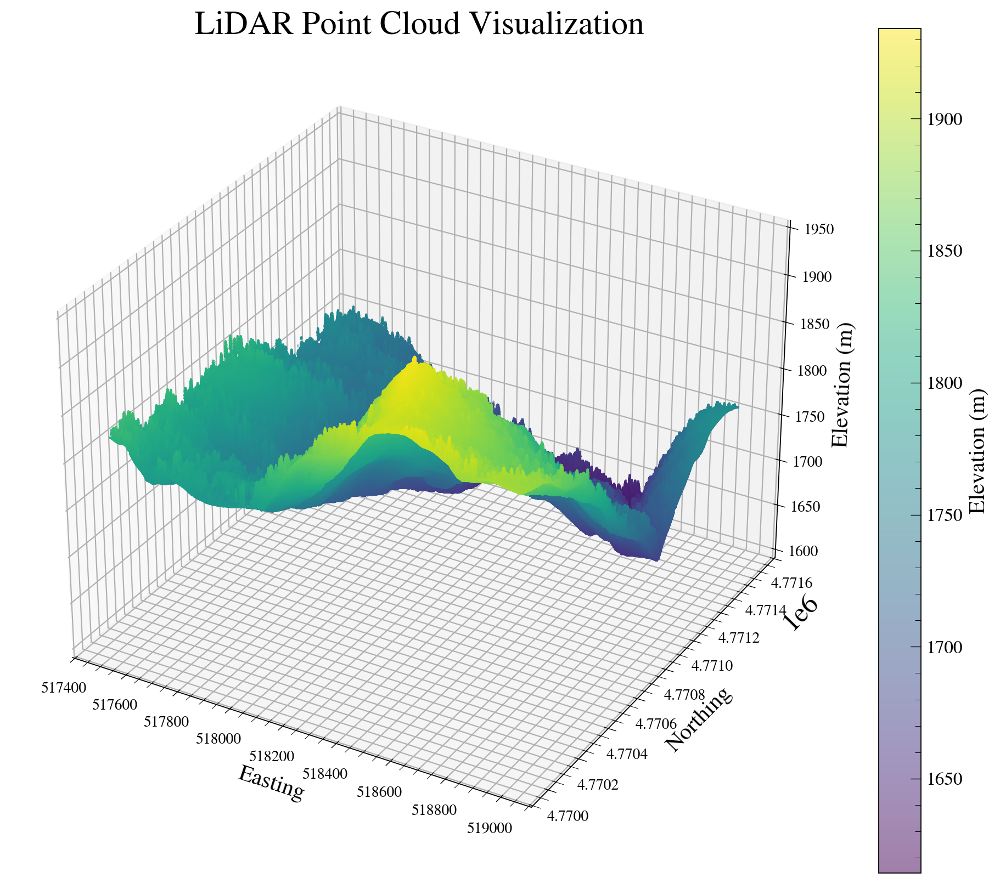

In [31]:
# Create a 3D scatter plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection="3d")

# Scatter plot of the X, Y, Z coordinates
sc = ax.scatter(data_airbone_lidar["Easting"], 
                data_airbone_lidar["Northing"], 
                data_airbone_lidar["Elevation"], 
                c=data_airbone_lidar["Elevation"],  # Use elevation for color mapping
                cmap='viridis',  # Choose a colormap (viridis, plasma, etc.)
                s=0.1, alpha=0.5)

# Set labels
ax.set_xlabel("Easting", fontsize=15)
ax.set_ylabel("Northing", fontsize=15)
ax.set_zlabel("Elevation (m)", fontsize=15)
ax.tick_params(labelsize = 10)
plt.title("LiDAR Point Cloud Visualization")

# Add colorbar
cbar = plt.colorbar(sc)  # Associate the colorbar with the scatter plot
cbar.ax.tick_params(labelsize=12)  # set font size of colorbar tick labels
cbar.set_label("Elevation (m)", fontsize=15)  # Label for the colorbar

# Show the plot
plt.show()

### Compute Vegetation Height Using: DSM, DTM (bare earth), and Highest Hit (for bounding box) Rasters

#### Method 1: 
Resample and reproject the DTM (bare earth) raster within the bounding box of the highest hit raster and compute the canopy height model as:
$CHM = HH_{aligned} - DTM_{aligned}.$


**NOTE: The highest hit raster come in tiles but the bare earth (DTM) raster is not tiled.**

CHM written to: /bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_highest_hit_extent.tif
Stats over highest-hit bbox -> min=0.00 m, max=38.10 m, mean=5.81 m


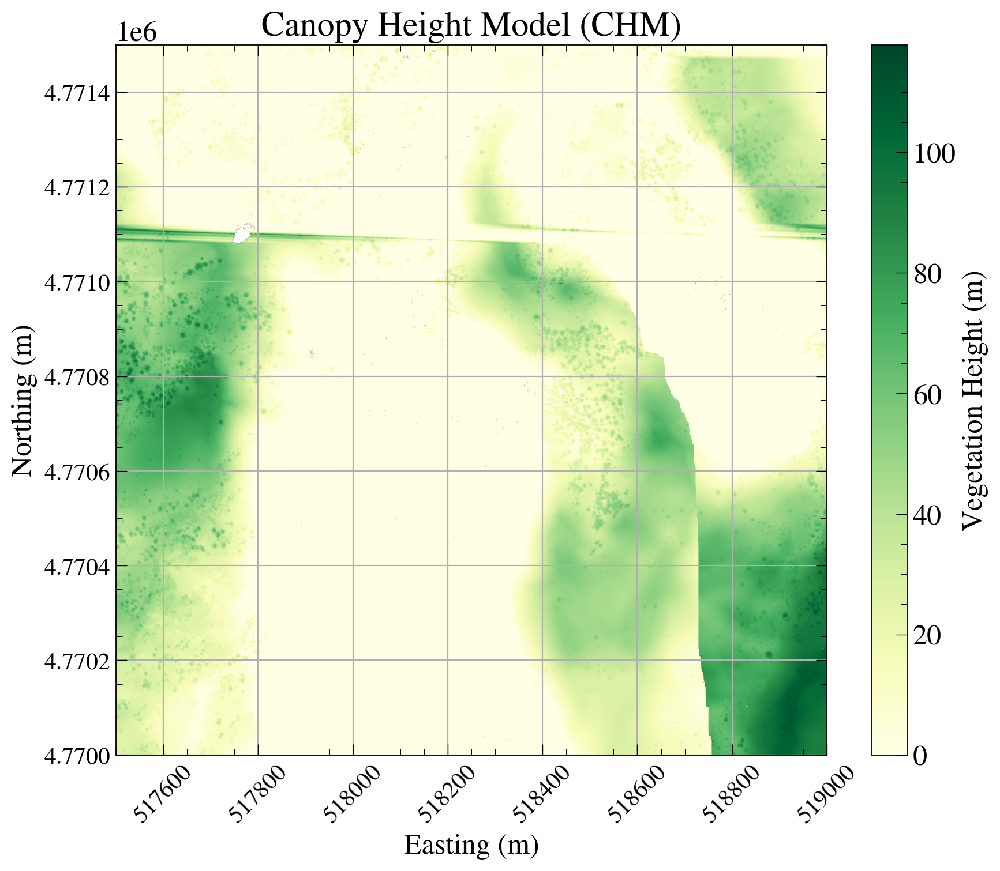

In [22]:
def chm_from_highesthit_and_dtm(highest_hit_path, dtm_path, out_path, *, resampling=Resampling.bilinear):
    """
    Compute Canopy Height Model (CHM) over the extent of the highest-hit raster by
    reprojecting/resampling the DTM to the highest-hit grid and subtracting: CHM = HH - DTM.

    Parameters
    ----------
    highest_hit_path : str
        Path to highest-hit raster (acts like DSM); defines target grid/CRS/extent.
    dtm_path : str
        Path to bare-earth DTM raster (may be larger extent and/or different CRS/resolution).
    out_path : str
        Output path for CHM GeoTIFF.
    resampling : rasterio.warp.Resampling, optional
        Resampling method for continuous elevation data. Default: bilinear.

    Notes
    -----
    - Works even if CRS/resolution differ; DTM is reprojected onto highest-hit grid.
    - Output CHM has the same georeferencing, size, and bbox as the highest-hit raster.
    - Negative values (due to mismatches/noise) are clipped to 0.
    """

    # Open sources
    with rasterio.open(highest_hit_path) as hh_src, rasterio.open(dtm_path) as dtm_src:
        # Read the highest hit (single band assumed)
        hh = hh_src.read(1, masked=True)
        hh_profile = hh_src.profile.copy()

        # Prepare destination (aligned DTM) with same shape as highest hit
        dtm_aligned = np.empty(hh.shape, dtype=np.float32)

        # Determine NoData handling
        dtm_nodata = dtm_src.nodata
        if dtm_nodata is None:
            # If missing, try to infer a nodata mask from unreasonable values
            dtm_nodata = np.nan  # let reproject generate valid_mask, we’ll mask later

        # Reproject DTM -> highest-hit grid (this crops to the highest-hit bbox)
        reproject(
            source=rasterio.band(dtm_src, 1),
            destination=dtm_aligned,
            src_transform=dtm_src.transform,
            src_crs=dtm_src.crs,
            src_nodata=dtm_src.nodata,
            dst_transform=hh_src.transform,
            dst_crs=hh_src.crs,
            dst_nodata=np.nan,               # keep NaNs where DTM has no data after reprojection
            resampling=resampling,
        )

    # Build masked arrays respecting nodata/NaN
    dtm_aligned_ma = np.ma.masked_invalid(dtm_aligned)
    hh_ma = np.ma.masked_array(hh, mask=np.ma.getmaskarray(hh) | np.ma.getmaskarray(dtm_aligned_ma))

    # Compute CHM and clip negatives to 0
    chm = (hh_ma - dtm_aligned_ma).filled(np.nan)
    chm = np.where(np.isfinite(chm), chm, np.nan)
    chm = np.clip(chm, 0, None).astype(np.float32)

    # Write CHM with highest-hit georeferencing
    out_profile = hh_profile.copy()
    out_profile.update(
        dtype=rasterio.float32,
        count=1,
        nodata=np.nan
    )

    with rasterio.open(out_path, "w", **out_profile) as dst:
        dst.write(chm, 1)

    # Optional quick stats
    finite = np.isfinite(chm)
    if finite.any():
        chm_min, chm_max, chm_mean = float(chm[finite].min()), float(chm[finite].max()), float(chm[finite].mean())
        print(f"CHM written to: {out_path}")
        print(f"Stats over highest-hit bbox -> min={chm_min:.2f} m, max={chm_max:.2f} m, mean={chm_mean:.2f} m")
    else:
        print(f"CHM written to: {out_path} (all values are NaN after reprojection/masking)")

if __name__ == "__main__":
    # ---- usage ----
    hh_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH175700.tif"
    # hh_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH190820.tif"
    be_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/SouthernIdaho2018_21_be_02.tif"
    chm_from_highesthit_and_dtm(
        highest_hit_path=hh_tif_path,
        dtm_path=be_tif_path,
        out_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_highest_hit_extent.tif",
    )
    
    # chm_path1 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_highest_hit_extent.tif"
    # chm_path1 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/chm/chm2.tif"
    chm_path1 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/new_chms2/Titus_laschm_lasgrid_avg_minus_lasgrid_lasdtm_11TNH175700.tif"
    with rasterio.open(chm_path1) as src:
        fig, ax = plt.subplots(figsize=(10, 8))
        show(src, ax=ax, cmap="YlGn", vmin=0)
        ax.set_title("Canopy Height Model (CHM)")
        ax.tick_params(axis='x', labelsize=15, rotation=45)
        ax.tick_params(axis='y', labelsize=15)
        ax.set_xlabel("Easting (m)")
        ax.set_ylabel("Northing (m)")

        # Add colorbar
        im = ax.get_images()[0]   # grab the image drawn by rasterio
        cbar = fig.colorbar(im, ax=ax)
        cbar.set_label("Vegetation Height (m)")

    plt.show()


#### Method 2:
Resample and reproject the DTM (bare earth) and DSM rasters within the bounding box of the highest hit raster and compute the canopy height model as:
$CHM = DSM_{aligned} - DTM_{aligned}.$

**NOTE: The highest hit raster come in tiles but the bare earth (DTM) and DSM rasters are not tiled.**

CHM: /bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_highest_hit_bbox.tif Stats: {'min': 0.0, 'max': 37.5462646484375, 'mean': 5.815765380859375}


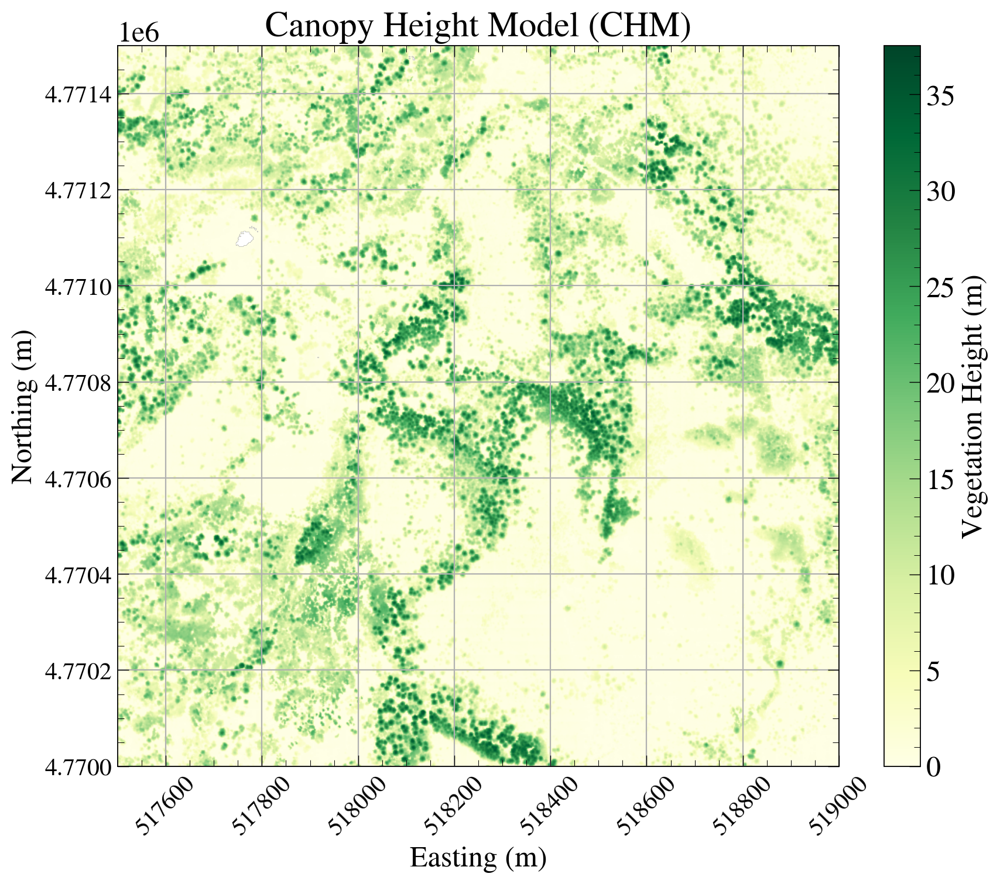

In [20]:
def resample_to_target(src_path, target_src, *, resampling=Resampling.bilinear, dst_dtype=np.float32):
    """
    Reproject/resample a raster (src_path) onto the grid/CRS of an already-open
    target rasterio dataset (target_src). Returns the aligned array.
    """
    with rasterio.open(src_path) as s:
        dst = np.empty((target_src.height, target_src.width), dtype=dst_dtype)
        reproject(
            source=rasterio.band(s, 1),
            destination=dst,
            src_transform=s.transform,
            src_crs=s.crs,
            src_nodata=s.nodata,
            dst_transform=target_src.transform,
            dst_crs=target_src.crs,
            dst_nodata=np.nan,                   # keep NaNs where source has no data
            resampling=resampling,
        )
    return dst

def chm_from_dsm_and_dtm_over_highesthit_bbox(
    highest_hit_path, dsm_path, dtm_path,
    out_chm_path, out_dsm_aligned_path=None, out_dtm_aligned_path=None,
    *, dsm_resampling=Resampling.bilinear, dtm_resampling=Resampling.bilinear,
    clip_negative_to_zero=True
):
    """
    Align DSM and DTM to the bounding box and grid of the highest-hit raster,
    then compute CHM = DSM_aligned - DTM_aligned, and write to GeoTIFF.

    Parameters
    ----------
    highest_hit_path : str
        Path to the highest-hit raster (defines target CRS, transform, size, bbox).
    dsm_path : str
        Path to DSM raster (surface elevations).
    dtm_path : str
        Path to bare-earth DTM raster (ground elevations).
    out_chm_path : str
        Output CHM GeoTIFF path.
    out_dsm_aligned_path : str, optional
        If given, also write the DSM aligned to the highest-hit grid.
    out_dtm_aligned_path : str, optional
        If given, also write the DTM aligned to the highest-hit grid.
    dsm_resampling : rasterio.warp.Resampling
        Resampling kernel for DSM (continuous surface -> bilinear/cubic).
    dtm_resampling : rasterio.warp.Resampling
        Resampling kernel for DTM (continuous surface -> bilinear/cubic).
    clip_negative_to_zero : bool
        If True, negative CHM values are set to 0.

    Returns
    -------
    dict with paths and basic stats.
    """
    with rasterio.open(highest_hit_path) as hh_src:
        target_profile = hh_src.profile.copy()
        target_profile.update(count=1, dtype=rasterio.float32, nodata=np.nan)

        # Reproject/crop DSM and DTM onto highest-hit grid
        dsm_aligned = resample_to_target(dsm_path, hh_src, resampling=dsm_resampling)
        dtm_aligned = resample_to_target(dtm_path, hh_src, resampling=dtm_resampling)

        # Mask invalids
        dsm_ma = np.ma.masked_invalid(dsm_aligned)
        dtm_ma = np.ma.masked_invalid(dtm_aligned)
        common_mask = np.ma.getmaskarray(dsm_ma) | np.ma.getmaskarray(dtm_ma)

        # Compute CHM = DSM - DTM over highest-hit bbox
        chm = (dsm_ma - dtm_ma).filled(np.nan).astype(np.float32)
        if clip_negative_to_zero:
            chm = np.where(np.isfinite(chm), np.maximum(chm, 0.0), np.nan).astype(np.float32)

        # Write outputs
        if out_dsm_aligned_path:
            prof = target_profile.copy()
            with rasterio.open(out_dsm_aligned_path, "w", **prof) as dst:
                dst.write(dsm_aligned.astype(np.float32), 1)

        if out_dtm_aligned_path:
            prof = target_profile.copy()
            with rasterio.open(out_dtm_aligned_path, "w", **prof) as dst:
                dst.write(dtm_aligned.astype(np.float32), 1)

        with rasterio.open(out_chm_path, "w", **target_profile) as dst:
            dst.write(chm, 1)

    # Stats
    finite = np.isfinite(chm)
    stats = {}
    if finite.any():
        stats = {
            "min": float(chm[finite].min()),
            "max": float(chm[finite].max()),
            "mean": float(chm[finite].mean()),
        }

    return {
        "chm_path": out_chm_path,
        "dsm_aligned_path": out_dsm_aligned_path,
        "dtm_aligned_path": out_dtm_aligned_path,
        "stats": stats,
    }

if __name__ == "__main__":
    # ---- usage ----
    hh_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH175700.tif"
    # hh_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH190820.tif"
    be_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/SouthernIdaho2018_21_be_02.tif"
    dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM/SouthernIdaho2018_21_DSM.tif"
    out_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_highest_hit_bbox.tif"

    res = chm_from_dsm_and_dtm_over_highesthit_bbox(
        highest_hit_path=hh_tif_path,
        dsm_path=dsm_path,
        dtm_path=be_tif_path, #bare earth raster
        out_chm_path=out_path,
        out_dsm_aligned_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM_aligned.tif",
        out_dtm_aligned_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DTM_aligned.tif",
        dsm_resampling=Resampling.bilinear,
        dtm_resampling=Resampling.bilinear,  # or cubic; use nearest only if your DTM is categorical
    )
    print("CHM:", res["chm_path"], "Stats:", res["stats"])
    
    chm_path2 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_highest_hit_bbox.tif"
    with rasterio.open(chm_path2) as src:
        fig, ax = plt.subplots(figsize=(10, 8))
        show(src, ax=ax, cmap="YlGn", vmin=0)
        ax.set_title("Canopy Height Model (CHM)")
        ax.tick_params(axis='x', labelsize=15, rotation=45)
        ax.tick_params(axis='y', labelsize=15)
        ax.set_xlabel("Easting (m)")
        ax.set_ylabel("Northing (m)")

        # Add colorbar
        im = ax.get_images()[0]   # grab the image drawn by rasterio
        cbar = fig.colorbar(im, ax=ax)
        cbar.set_label("Vegetation Height (m)")

    plt.show()


CHM: /bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_known_bbox.tif Stats: {'min': 0.0, 'max': 1376.42333984375, 'mean': 1.4408612251281738}


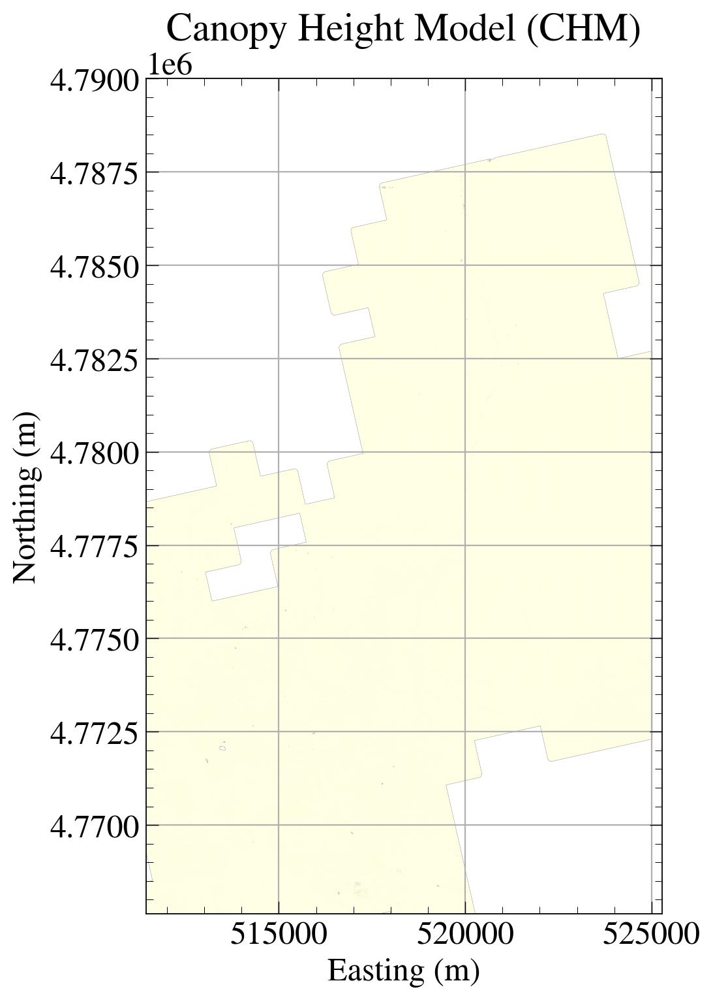

In [21]:
import math
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.transform import from_origin
from rasterio.io import MemoryFile
from rasterio.plot import show
import matplotlib.pyplot as plt

# ---- bbox ----
x_min, y_min, x_max, y_max = list(bbox_gedi) 

def resample_to_target(src_path, target_src, *, resampling=Resampling.bilinear, dst_dtype=np.float32):
    """
    Reproject/resample a raster (src_path) onto the grid/CRS of an already-open
    target rasterio dataset (target_src). Returns the aligned array.
    """
    with rasterio.open(src_path) as s:
        dst = np.empty((target_src.height, target_src.width), dtype=dst_dtype)
        reproject(
            source=rasterio.band(s, 1),
            destination=dst,
            src_transform=s.transform,
            src_crs=s.crs,
            src_nodata=s.nodata,
            dst_transform=target_src.transform,
            dst_crs=target_src.crs,
            dst_nodata=np.nan,
            resampling=resampling,
        )
    return dst

def _make_target_ds_from_bbox(hh_like_path, x_min, y_min, x_max, y_max):
    """
    Build an in-memory target dataset using CRS & pixel size from hh_like_path,
    but the extent (transform/shape) from the provided bbox.
    """
    with rasterio.open(hh_like_path) as ref:
        crs = ref.crs
        # pixel sizes (assumes square pixels; if not, use ref.res[0], ref.res[1])
        px_x, px_y = ref.res  # px_y is positive spacing; north-up uses negative in transform

    width  = int(math.ceil((x_max - x_min) / px_x))
    height = int(math.ceil((y_max - y_min) / px_y))

    # transform: upper-left origin (x_min, y_max)
    transform = from_origin(x_min, y_max, px_x, px_y)

    profile = {
        "driver": "GTiff",
        "height": height,
        "width": width,
        "count": 1,
        "dtype": "float32",
        "crs": crs,
        "transform": transform,
        "nodata": np.nan,
    }

    memfile = MemoryFile()
    ds = memfile.open(**profile)
    return memfile, ds  # caller must close both

def chm_from_dsm_and_dtm_over_bbox(
    hh_like_path, dsm_path, dtm_path,
    out_chm_path, out_dsm_aligned_path=None, out_dtm_aligned_path=None,
    *, dsm_resampling=Resampling.bilinear, dtm_resampling=Resampling.bilinear,
    clip_negative_to_zero=True,
    bbox=None  # (x_min, y_min, x_max, y_max)
):
    """
    Align DSM and DTM to the grid defined by `bbox` using the CRS and pixel size
    from `hh_like_path`, then compute CHM = DSM - DTM and write GeoTIFF.
    """
    assert bbox is not None and len(bbox) == 4, "Provide bbox=(x_min, y_min, x_max, y_max)"

    memfile, target_ds = _make_target_ds_from_bbox(hh_like_path, *bbox)
    try:
        # Reproject/crop onto bbox grid
        dsm_aligned = resample_to_target(dsm_path, target_ds, resampling=dsm_resampling)
        dtm_aligned = resample_to_target(dtm_path, target_ds, resampling=dtm_resampling)

        # Compute CHM
        chm = (dsm_aligned - dtm_aligned).astype(np.float32)
        # mask invalids where either source had NaN from reprojection
        invalid = ~np.isfinite(dsm_aligned) | ~np.isfinite(dtm_aligned)
        chm[invalid] = np.nan

        if clip_negative_to_zero:
            mask_fin = np.isfinite(chm)
            chm[mask_fin] = np.maximum(chm[mask_fin], 0.0).astype(np.float32)

        # Write outputs
        prof = target_ds.profile.copy()
        if out_dsm_aligned_path:
            with rasterio.open(out_dsm_aligned_path, "w", **prof) as dst:
                dst.write(dsm_aligned.astype(np.float32), 1)

        if out_dtm_aligned_path:
            with rasterio.open(out_dtm_aligned_path, "w", **prof) as dst:
                dst.write(dtm_aligned.astype(np.float32), 1)

        with rasterio.open(out_chm_path, "w", **prof) as dst:
            dst.write(chm, 1)

    finally:
        target_ds.close()
        memfile.close()

    # Stats
    finite = np.isfinite(chm)
    stats = {}
    if finite.any():
        stats = {
            "min": float(np.nanmin(chm)),
            "max": float(np.nanmax(chm)),
            "mean": float(np.nanmean(chm)),
        }

    return {
        "chm_path": out_chm_path,
        "dsm_aligned_path": out_dsm_aligned_path,
        "dtm_aligned_path": out_dtm_aligned_path,
        "stats": stats,
        "bbox": bbox,
    }

# --------------------- usage ---------------------
if __name__ == "__main__":
    hh_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH175700.tif"
    be_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/SouthernIdaho2018_21_be_02.tif"
    dsm_path    = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM/SouthernIdaho2018_21_DSM.tif"
    chm_path3    = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_known_bbox.tif"
    
    # use the known GEDI bbox
    bbox = (x_min, y_min, x_max, 4790000)#y_max)

    res = chm_from_dsm_and_dtm_over_bbox(
        hh_like_path=hh_tif_path,   # provides CRS and pixel size
        dsm_path=dsm_path,
        dtm_path=be_tif_path,       # bare earth raster
        out_chm_path=chm_path3,
        out_dsm_aligned_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM_aligned_to_bbox.tif",
        out_dtm_aligned_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DTM_aligned_to_bbox.tif",
        dsm_resampling=Resampling.bilinear,
        dtm_resampling=Resampling.bilinear,
        clip_negative_to_zero=True,
        bbox=bbox
    )
    print("CHM:", res["chm_path"], "Stats:", res["stats"])

    # quick visualization
    with rasterio.open(res["chm_path"]) as src:
        fig, ax = plt.subplots(figsize=(8, 8))
        show(src, ax=ax, cmap="YlGn", vmin=0)
        ax.set_title("Canopy Height Model (CHM)")
        ax.set_xlabel("Easting (m)"); ax.set_ylabel("Northing (m)")
        # im = ax.get_images()[0]   # grab the image drawn by rasterio
        # cbar = fig.colorbar(im, ax=ax)
        # cbar.set_label("Vegetation Height (m)")
        ax.set_aspect("equal")
        plt.tight_layout()
        plt.show()


In [19]:
# import rasterio
# from rasterio import features
# import geopandas as gpd
# from shapely.geometry import shape

# # Input and output
# tif_path = chm_path3
# shp_out = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/raster_vectorized.shp"

# with rasterio.open(tif_path) as src:
#     image = src.read(1)
#     mask = image != src.nodata  # ignore nodata pixels
#     results = features.shapes(image, mask=mask, transform=src.transform)

#     geoms = []
#     values = []
#     for geom, val in results:
#         geoms.append(shape(geom))
#         values.append(val)

#     gdf = gpd.GeoDataFrame({"value": values}, geometry=geoms, crs=src.crs)
#     gdf.to_file(shp_out)

# print("Vectorized shapefile saved as:", shp_out)


511435.15397784254 4767616.0 525279.1539778425 4790000.0


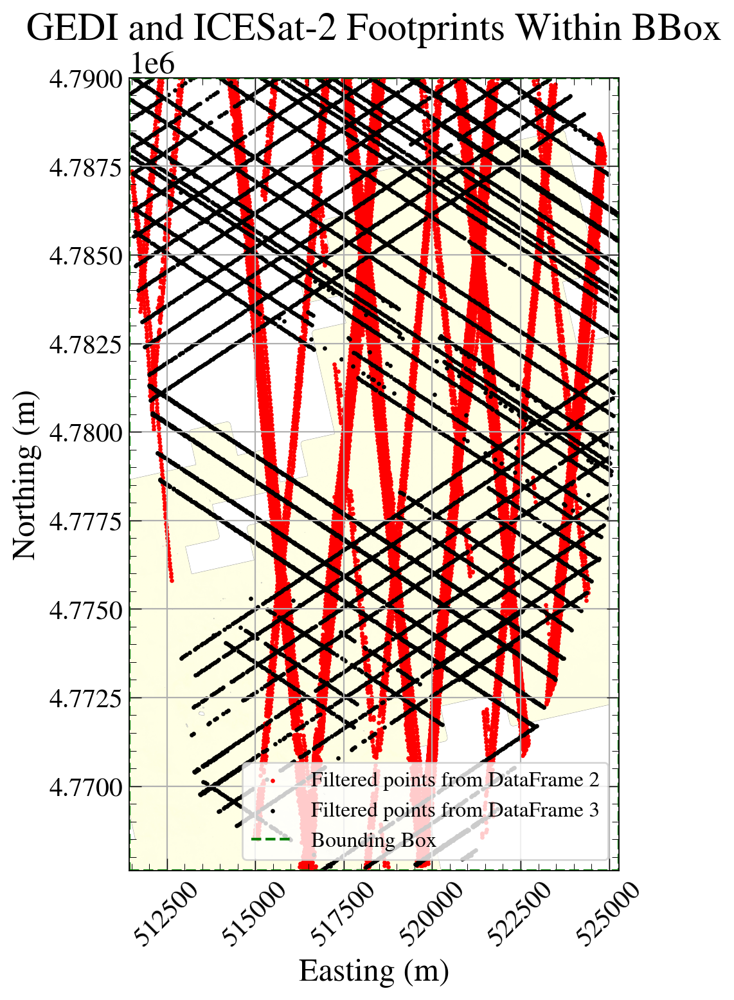

In [20]:
def plot_data_within_bounding_box(df1_path, df2, df3):
    """
    Finds the bounding box region of interest of the first DataFrame (df1), filters the second and third DataFrames (df2)
    for points within the bounding box, and plots the results.

    Parameters:
        df1 (DataFrame): The first DataFrame containing the points for defining the bounding box.
        df2 (DataFrame): The second DataFrame containing the points to be filtered by the bounding box.
        df3 (DataFrame): The second DataFrame containing the points to be filtered by the bounding box.

    Returns:
        None: Displays the plot.
    """
    # Plot the data
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Find the bounding box region of interest from df1 (min/max of x and y)
    with rasterio.open(df1_path) as src: 
        x_min, y_min, x_max, y_max = src.bounds
        print(x_min, y_min, x_max, y_max)
        show(src, ax=ax, cmap="YlGn", vmin=0)
        
    # Filter df2 to find all points within the bounding box of df1
    df2_filtered = df2[(df2["Easting"] >= x_min) & (df2["Easting"] <= x_max) &
                       (df2["Northing"] >= y_min) & (df2["Northing"] <= y_max)]
    
    # Filter df2 to find all points within the bounding box of df1
    df3_filtered = df3[(df3["Easting"] >= x_min) & (df3["Easting"] <= x_max) &
                       (df3["Northing"] >= y_min) & (df3["Northing"] <= y_max)]

    # Plot all points in df1 (whole dataset)
    # ax.scatter(df1["Easting"], df1["Northing"], c="blue", alpha=0.05, label="DataFrame 1 (All points)", s=10)

    # Plot the selected points from df2 that fall within the bounding box
    ax.scatter(df2_filtered["Easting"], df2_filtered["Northing"], c="red", alpha=1.0, label="Filtered points from DataFrame 2", s=2)

    # Plot the selected points from df2 that fall within the bounding box
    ax.scatter(df3_filtered["Easting"], df3_filtered["Northing"], c="black", alpha=1.0, label="Filtered points from DataFrame 3", s=2)

    # Highlight the bounding box with a rectangle
    ax.plot([x_min, x_max, x_max, x_min, x_min], 
             [y_min, y_min, y_max, y_max, y_min], 
             color="green", linestyle="--", label="Bounding Box")

    # Labels and title
    ax.set_title("GEDI and ICESat-2 Footprints Within BBox")
    ax.tick_params(axis='x', labelsize=15, rotation=45)
    ax.tick_params(axis='y', labelsize=15)
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")
    ax.legend(fontsize=12)

    # Show the plot
    plt.show()

# Plot the points
plot_data_within_bounding_box(chm_path3, icesat2_gdf_atl08, gedi_data) 

In [21]:
bbox_gedi
# 511435.15397784254 4767614.588179245 525279.1539778425 4795514.588179245

(511435.15397784254, 4767616.136804331, 525279.148863292, 4795514.588179245)

In [22]:
def filter_data(df1_path, df2, df3):
    """
    Filters footprints/segments from df2 and df3 within the bounding box of df1,
    drawing precise rectangles (13m x 100m) around each df2 filtered point, 
    and a circle of radius 12.5 meters around each df3 filtered point.

    Parameters:
        df1 (DataFrame): The reference dataset used to define the bounding region.
        df2 (DataFrame): The dataset whose points will be filtered and highlighted.
        df3 (DataFrame): The dataset whose points will be filtered and highlighted.

    Returns:
        DataFrames: Filtered subset of df2 and df3 within df1's bounding box.
    """
    # Find the bounding box region of interest from df1 (min/max of x and y)
    with rasterio.open(df1_path) as src: 
        x_min, y_min, x_max, y_max = src.bounds
        print(x_min, y_min, x_max, y_max)

    # Filter df2 within df1 bounding box
    df2_filtered = df2[
        (df2["Easting"] >= x_min) & (df2["Easting"] <= x_max) &
        (df2["Northing"] >= y_min) & (df2["Northing"] <= y_max)
    ]
    
    # Filter df3 within df1 bounding box
    df3_filtered = df3[
        (df3["Easting"] >= x_min) & (df3["Easting"] <= x_max) &
        (df3["Northing"] >= y_min) & (df3["Northing"] <= y_max)
    ]
    return df2_filtered, df3_filtered
icesat2_filtered, gedi_filtered = filter_data(chm_path3, icesat2_gdf_atl08, gedi_data)

511435.15397784254 4767616.0 525279.1539778425 4790000.0


In [23]:
icesat2_filtered.columns

Index(['time', 'x_atc', 'h_min_canopy', 'h_te_median', 'gt', 'spot', 'rgt',
       'gnd_ph_count', 'h_mean_canopy', 'h_canopy', 'h_max_canopy',
       'snowcover', 'ph_count', 'canopy_h_metrics', 'solar_elevation_x',
       'segment_id', 'veg_ph_count', 'landcover', 'extent_id',
       'canopy_openness', 'cycle', 'num_bins', 'binsize', 'waveform',
       'pce_mframe_cnt', 'solar_elevation_y', 'h_dif_ref', 'Longitude',
       'Latitude', 'Easting', 'Northing', 'elevation_NAVD88_icesat2_from_pipe',
       'Elevation', 'Date', 'date', 'geometry'],
      dtype='object')

In [24]:
print(np.unique(icesat2_filtered["rgt"]))
print(np.unique(icesat2_filtered["gt"]))
list(np.unique(icesat2_filtered["date"]))[14:16]

[  59  463  501  905  943 1347 1385]
[10 20 30 40 50 60]


['2021-08-24', '2021-09-19']

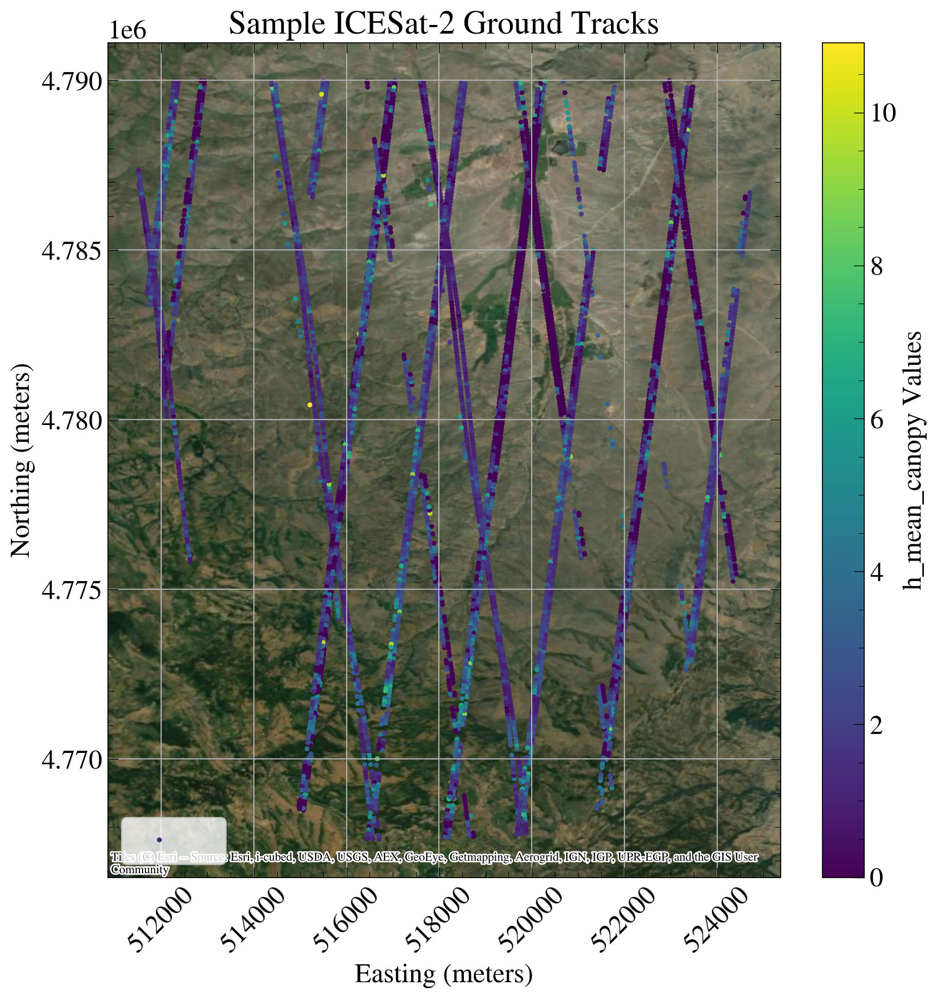

In [25]:
date_list = list(np.unique(icesat2_gdf_atl08["date"]))

# icesat2_filtered2 = icesat2_filtered[icesat2_filtered["date"] != "2023-10-21"]
# icesat2_filtered2 = icesat2_filtered[icesat2_filtered["date"].isin(date_list[28:30])]
icesat2_filtered2 = icesat2_filtered[icesat2_filtered["date"].isin(date_list[:10])]

# Plot the merged dataset
fig, ax = plt.subplots(figsize=(10, 10))
# Create a scatter plot where color is based on vegetation height values
scatter = ax.scatter(icesat2_filtered2.geometry.x, icesat2_filtered2.geometry.y,
                     c=icesat2_filtered2["h_mean_canopy"], cmap="viridis", s=5, alpha=1.0, label=" ")

# Add a color bar to the plot
cbar = plt.colorbar(scatter, ax=ax, orientation="vertical")
cbar.set_label("h_mean_canopy Values")

# Adding a basemap 
ctx.add_basemap(ax, crs=icesat2_gdf_atl08.crs, source=ctx.providers.Esri.WorldImagery)

# Formatting the map
plt.legend()
plt.title("Sample ICESat-2 Ground Tracks")
plt.xlabel("Easting (meters)")
plt.ylabel("Northing (meters)")
plt.tick_params(axis='x', rotation=45)
plt.show()


In [26]:
def icesat2_gt_endflag(icesat2_df):
    """
    Logically find the ends of unique ICESat-2 ground tracks according to dates.
    
    Steps:
    - We sort data first by time and then ground track (gt) to make sure all the points are ordered correctly. 
    - Use the unique function to identify the first instance of unique pairs of date and gt in the dataset thus giving the start of a new track. 
    - Identify the row above each track start as the end of the previous track.
    
    Parameters:
    - icesat2_df: ICESat-2 dataframe, assumed to be a pandas DataFrame with 'time' (datetime64), 'gt' (beam), and 'norths' already defined.

    Returns:
    - end_flag: logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. It is helps to avoid wrapping errors at track edges.
    """
    
    # 1. Sort by 'time' and 'gt'
    sorted_df = icesat2_df.sort_values(by=["time", "gt"]).reset_index(drop=True)

    # 2. Extract only the date (ignore time of day)
    dates = pd.to_datetime(sorted_df["time"].dt.date)

    # 3. Create a combined key of date and 'gt' and find first occurrence (like MATLAB's unique rows)
    date_gt = pd.DataFrame({"date": dates, "gt": sorted_df["gt"]})
    unique_refs = date_gt.drop_duplicates(keep="first").index

    # 4. Initialize end_flag with zeros (same length as number of rows)
    end_flag = np.zeros(len(sorted_df), dtype=int)

    # 5. Flag unique_refs
    end_flag[unique_refs] = 1
    # Also flag the entry just before each unique_ref (unless it's 0)
    for idx in unique_refs:
        if idx > 0:
            end_flag[idx - 1] = 1
    # Flag the last element
    end_flag[-1] = 1
    return end_flag

end_flag = icesat2_gt_endflag(icesat2_filtered2)
end_flag

array([1, 0, 0, ..., 0, 0, 1])

In [27]:
end_flag.shape

(5700,)

In [28]:
def icesat2_footprint_corners(
    norths: np.ndarray,
    easts: np.ndarray,
    default_length: float,
    end_flag: np.ndarray
):
    """
    Calculate ICESat-2 footprint corners and orientation angles.
    This code inherently includes bearing-based orientation using the geometry of the ground track.

    Parameters:
    - norths: array of northing coordinates.
    - easts: array of easting coordinates.
    - default_length: default footprint length (e.g., 100 for ATLO8 or 40 meters for ATL06).
    - end_flag: logical array indicating last point in each track. It is a binary array indicating where new tracks begin/end. It is helps to avoid wrapping errors at track edges.

    Returns:
    - xc: x corner coordinates (N x 6)
    - yc: y corner coordinates (N x 6)
    - theta: footprint orientation angles (N,). The angle theta between the icesat2 track and due east
    """
    footwidth = 13  # segment width (meters)
    n = norths.shape[0]

    theta = np.full((n, 2), np.nan)
    xc = np.full((n, 6), np.nan)
    yc = np.full((n, 6), np.nan)

    # create polygons of ICESat-2 footprints
    for r in range(n-1):
        # calculate the footprint orientation
        if r == 0 or end_flag[r] - end_flag[r - 1] == 0: # only angle pointed forwards
            theta[r, 0] = np.degrees(np.arctan2(norths[r + 1] - norths[r], easts[r + 1] - easts[r]))
            theta[r, 1] = theta[r, 0]
            footlength = default_length
        elif r == n - 1 or end_flag[r] - end_flag[r + 1] == 0: # only angle pointed backwards
            theta[r, 0] = np.degrees(np.arctan2(norths[r] - norths[r - 1], easts[r] - easts[r - 1]))
            theta[r, 1] = theta[r, 0]
            footlength = default_length
        else: # calculate angles in each direction
            theta[r, 0] = np.degrees(np.arctan2(norths[r] - norths[r - 1], easts[r] - easts[r - 1]))
            theta[r, 1] = np.degrees(np.arctan2(norths[r + 1] - norths[r], easts[r + 1] - easts[r]))
            footlength = 0.5 * np.sqrt((norths[r + 1] - norths[r - 1])**2 + (easts[r + 1] - easts[r - 1])**2)
            
        # find box edges along the RGT
        back_x = easts[r] - (footlength / 2) * np.cos(np.radians(theta[r, 0]))
        back_y = norths[r] - (footlength / 2) * np.sin(np.radians(theta[r, 0]))
        front_x = easts[r] + (footlength / 2) * np.cos(np.radians(theta[r, 1]))
        front_y = norths[r] + (footlength / 2) * np.sin(np.radians(theta[r, 1]))
        mean_theta = np.nanmean(theta[r, :])
        
        # find box edges perpendicular to the centroid
        xc[r, 0] = easts[r] + (footwidth / 2) * np.cos(np.radians(mean_theta + 90))
        yc[r, 0] = norths[r] + (footwidth / 2) * np.sin(np.radians(mean_theta + 90))
        xc[r, 1] = easts[r] + (footwidth / 2) * np.cos(np.radians(mean_theta - 90))
        yc[r, 1] = norths[r] + (footwidth / 2) * np.sin(np.radians(mean_theta - 90))
        
        # solve for corner coordinates
        xc[r, 2] = back_x + (footwidth / 2) * np.cos(np.radians(theta[r, 0] + 90))
        yc[r, 2] = back_y + (footwidth / 2) * np.sin(np.radians(theta[r, 0] + 90))
        xc[r, 3] = back_x + (footwidth / 2) * np.cos(np.radians(theta[r, 0] - 90))
        yc[r, 3] = back_y + (footwidth / 2) * np.sin(np.radians(theta[r, 0] - 90))

        xc[r, 4] = front_x + (footwidth / 2) * np.cos(np.radians(theta[r, 1] - 90))
        yc[r, 4] = front_y + (footwidth / 2) * np.sin(np.radians(theta[r, 1] - 90))
        xc[r, 5] = front_x + (footwidth / 2) * np.cos(np.radians(theta[r, 1] + 90))
        yc[r, 5] = front_y + (footwidth / 2) * np.sin(np.radians(theta[r, 1] + 90))
    return xc, yc, theta[:, 0]

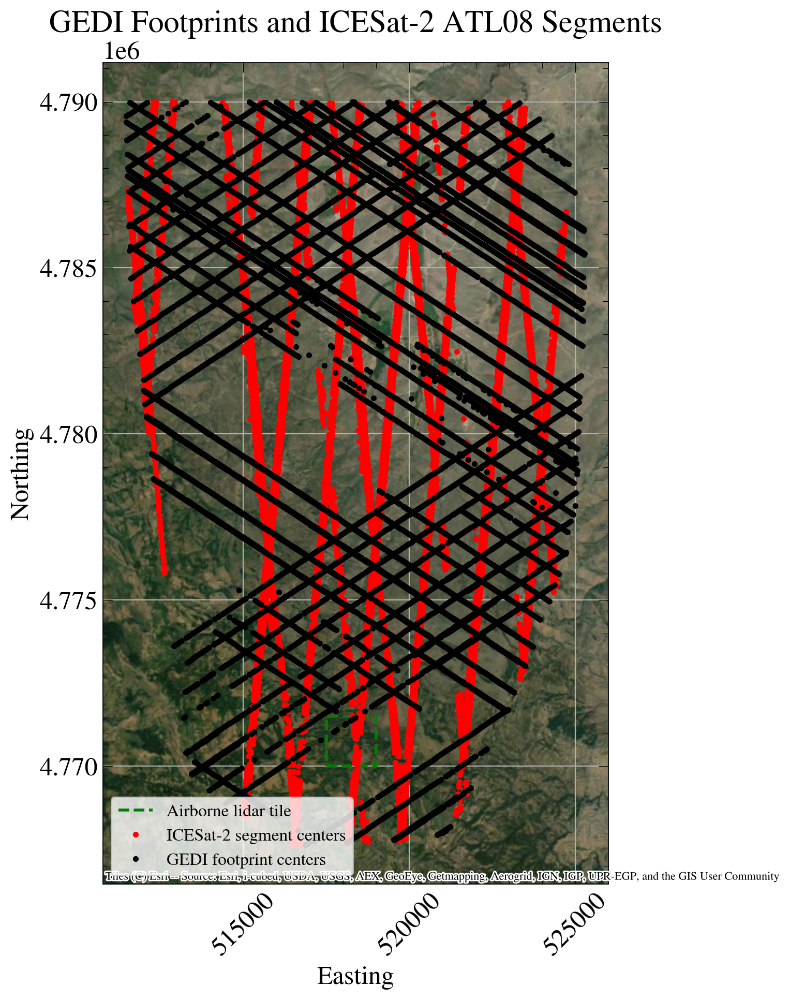

In [29]:
# Easting and Northing coordinates
norths_icesat2 = icesat2_filtered2["Northing"].values
easts_icesat2 = icesat2_filtered2["Easting"].values
norths_gedi = gedi_filtered["Northing"].values
easts_gedi = gedi_filtered["Easting"].values

# Call function to get segment corners
xc, yc, theta = icesat2_footprint_corners(norths = norths_icesat2, 
                                          easts = easts_icesat2, 
                                          default_length = 100.0, 
                                          end_flag = end_flag)

# Plot setup
fig, ax = plt.subplots(figsize=(10, 10))
patches1 = []
patches2 = []

x_min, x_max = data_airbone_lidar["Easting"].min(), data_airbone_lidar["Easting"].max()
y_min, y_max = data_airbone_lidar["Northing"].min(), data_airbone_lidar["Northing"].max()

# Bounding box for air borne lidar data.
ax.plot([x_min, x_max, x_max, x_min, x_min],
        [y_min, y_min, y_max, y_max, y_min],
        color="green", linestyle="--", linewidth=2, 
        label="Airborne lidar tile")

# ICESat-2 ATL08 segments: Iterate over segments to create polygon patches
for i in range(xc.shape[0]):
    if np.any(np.isnan(xc[i])) or np.any(np.isnan(yc[i])):
        continue  # Skip invalid segments
    
    # Create polygon from the 6 corners (can also simplify to first 4 if rectangle)
    footprint = [(xc[i, j], yc[i, j]) for j in range(6)]
    
    # You can use first 4 points to form a closed rectangle if desired:
    rect_points = [footprint[2], footprint[3], footprint[4], footprint[5]]

    polygon = Polygon(rect_points, closed=True)
    patches1.append(polygon)

# Add all patches to plot
p1 = PatchCollection(patches1, facecolor="skyblue", edgecolor="k", alpha=0.5)
ax.add_collection(p1)

# Plot segment centers
ax.plot(easts_icesat2, norths_icesat2, "ro", markersize=3, label="ICESat-2 segment centers")

# GEDI footprints: Draw a circle of radius 12.5 meters around each segment center
radius = 12.5  # meters
for x, y in zip(easts_gedi, norths_gedi):
    if np.isnan(x) or np.isnan(y):
        continue
    circle = Circle((x, y), radius=radius)
    patches2.append(circle)
    
# Add all patches to plot
p2 = PatchCollection(patches2, facecolor="magenta", edgecolor="k", alpha=0.5)
ax.add_collection(p2)

# Plot segment centers
ax.plot(easts_gedi, norths_gedi, "ko", markersize=3, label="GEDI footprint centers")

# Adding a basemap 
ctx.add_basemap(ax, crs=icesat2_gdf_atl08.crs, source=ctx.providers.Esri.WorldImagery)

# Axis settings
ax.set_aspect("equal")
ax.set_xlabel("Easting")
ax.set_ylabel("Northing")
ax.set_title("GEDI Footprints and ICESat-2 ATL08 Segments")
ax.legend(fontsize=12)
plt.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

### Plot the unrotated vs rotated rectangles for comparison

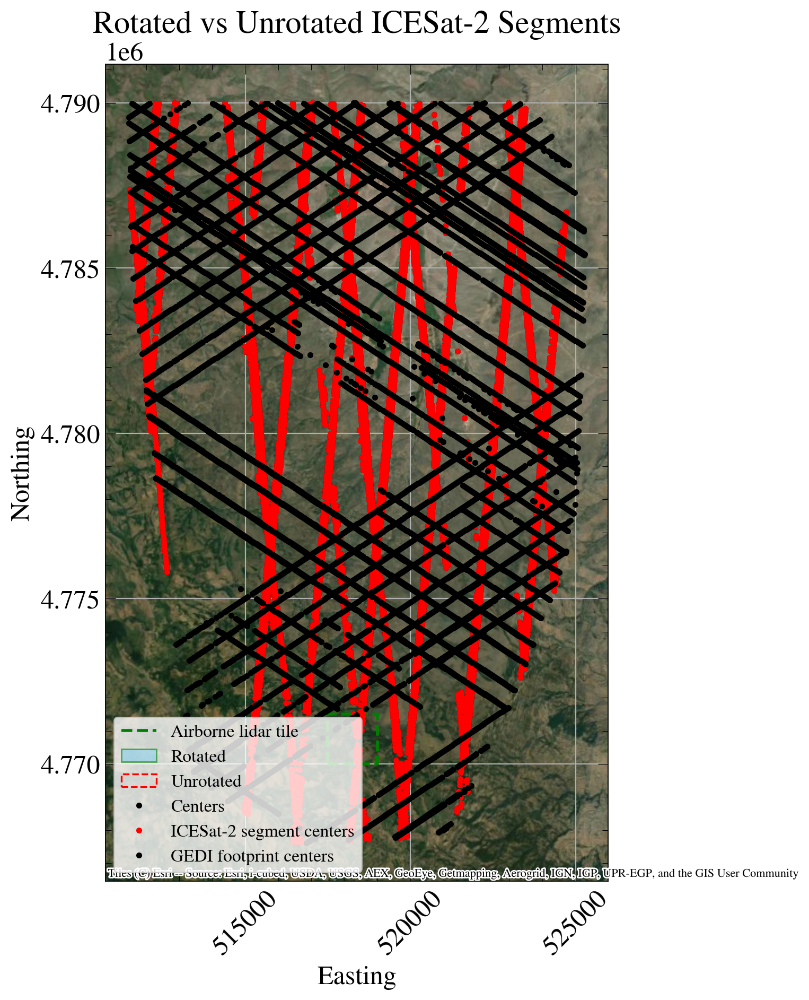

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

# Compute rotated corners
xc, yc, _ = icesat2_footprint_corners(norths_icesat2, easts_icesat2, 100, end_flag)

# Plot setup
fig, ax = plt.subplots(figsize=(10, 10))

# Bounding box for air borne lidar data.
ax.plot([x_min, x_max, x_max, x_min, x_min],
        [y_min, y_min, y_max, y_max, y_min],
        color="green", linestyle="--", linewidth=2, 
        label="Airborne lidar tile")

# Plot rotated rectangles
for i in range(xc.shape[0]):
    if np.any(np.isnan(xc[i])) or np.any(np.isnan(yc[i])):
        continue
    rotated_rect = [ (xc[i, j], yc[i, j]) for j in [2, 3, 4, 5] ]
    # ax.add_patch(Polygon(rotated_rect, closed=True, facecolor="none", edgecolor="green", label="Rotated" if i==0 else None))
    ax.add_patch(Polygon(rotated_rect, closed=True, facecolor="skyblue", alpha=0.6, edgecolor="green", label="Rotated" if i==0 else None))

# Plot unrotated rectangles
width, height = 13, 100
for i in range(len(easts_icesat2)):
    rect = [
        (easts_icesat2[i] - width / 2, norths_icesat2[i] - height / 2),
        (easts_icesat2[i] + width / 2, norths_icesat2[i] - height / 2),
        (easts_icesat2[i] + width / 2, norths_icesat2[i] + height / 2),
        (easts_icesat2[i] - width / 2, norths_icesat2[i] + height / 2),
    ]
    ax.add_patch(Polygon(rect, closed=True, facecolor="none", edgecolor="red", linestyle="--", linewidth=1.2, label="Unrotated" if i==0 else None))
    # ax.add_patch(Polygon(rect, closed=True, facecolor="red", alpha=0.2, edgecolor="red", linestyle="--", label="Unrotated" if i==0 else None))

# Centers
ax.plot(easts_icesat2, norths_icesat2, "ko", markersize=3, label="Centers")


# Plot segment centers
ax.plot(easts_icesat2, norths_icesat2, "ro", markersize=3, label="ICESat-2 segment centers")

###############################
# GEDI footprints: Draw a circle of radius 12.5 meters around each segment center
patches2 = []
# GEDI footprints: Draw a circle of radius 12.5 meters around each segment center
radius = 12.5  # meters
for x, y in zip(easts_gedi, norths_gedi):
    if np.isnan(x) or np.isnan(y):
        continue
    circle = Circle((x, y), radius=radius)
    patches2.append(circle)
    
# Add all patches to plot
p2 = PatchCollection(patches2, facecolor="magenta", edgecolor="k", alpha=0.5)
ax.add_collection(p2)

# Plot segment centers
ax.plot(easts_gedi, norths_gedi, "ko", markersize=3, label="GEDI footprint centers")

#############################
# Adding a basemap
ctx.add_basemap(ax, crs=icesat2_gdf_atl08.crs, source=ctx.providers.Esri.WorldImagery)

# Legend & final touches
ax.set_aspect("equal")
ax.set_xlabel("Easting")
ax.set_ylabel("Northing")
ax.set_title("Rotated vs Unrotated ICESat-2 Segments")
ax.legend(fontsize=12)
ax.tick_params(axis='x', rotation=45)
plt.show()

### Classify canopies in ICESat-2 segments
#### Method 1

In [31]:
# import geopandas as gpd
# from shapely.geometry import Polygon, Point

# utm_code = "epsg:6340"
# # 1. Create GeoDataFrame for df2
# gdf2 = gpd.GeoDataFrame(data_airbone_lidar, geometry=gpd.points_from_xy(data_airbone_lidar.Easting, data_airbone_lidar.Northing), crs=utm_code)

# # 2. Create polygons from xc, yc
# polygons = [Polygon([(xc[i,j], yc[i,j]) for j in [2,3,4,5]]) for i in range(xc.shape[0])]
# gdf1 = gpd.GeoDataFrame(icesat2_filtered2.copy(), geometry=polygons, crs=utm_code)

# # 3. Use spatial join to associate df2 points with df1 polygons
# joined = gpd.sjoin(gdf2, gdf1, how="left", predicate="within")

# # 4. Group by segment and classify
# result = joined[joined["classification"].isin([1,2,3,4,5])].groupby("index_right")["classification"].agg(lambda x: x.value_counts().idxmax())
# icesat2_filtered2["assigned_class"] = icesat2_filtered2.index.map(result).fillna(2).astype(int)

In [32]:
# icesat2_filtered2[["h_mean_canopy", "h_canopy", "assigned_class"]]
# # joined
# # gdf1["geometry"].values[0]

#### Method 2

In [33]:
utm_code = "epsg:6340"
def _means_from_geoms(raster_path, geoms_gdf):
    """
    Compute mean of raster band 1 within each geometry.
    Returns a numpy array of means aligned to geoms_gdf.index.
    """
    means = np.full(len(geoms_gdf), np.nan, dtype="float64")
    medians = np.full(len(geoms_gdf), np.nan, dtype="float64")
    if len(geoms_gdf) == 0:
        return means, medians

    with rasterio.open(raster_path) as src:
        # Reproject geoms to raster CRS if needed
        gdf_in = geoms_gdf
        if geoms_gdf.crs is not None and src.crs is not None and geoms_gdf.crs != src.crs:
            gdf_in = geoms_gdf.to_crs(src.crs)

        for i, geom in zip(range(len(gdf_in)), gdf_in.geometry):
            if geom is None or geom.is_empty:
                continue
            try:
                out, _ = mask(src, [geom], crop=True, filled=False)  # masked array
                band = out[0]  # first band
                # band is a MaskedArray with mask=True outside geom and on nodata
                if band.count() > 0:
                    means[i] = band.mean()  # mean ignores masked values
                    # median that ignores masked values
                    m = np.ma.median(band)
                    medians[i] = float(m) if not getattr(m, "mask", False) else np.nan

            except ValueError:
                # geometry may be completely outside raster bounds
                continue
    return means, medians

def classify_data_footprints(df1, df2, df3_chm_path, xc, yc, radius=12.5):
    """
    Compute CHM means from a CHM raster (df3_chm_path) within:
      - ICESat-2 rotated polygons derived from (xc, yc)
      - GEDI circular buffers (radius, meters) around df2 centers

    Parameters:
    - df1 (DataFrame): ICESat-2 segments (will receive 'chm_mean').
    - df2 (DataFrame): GEDI footprints with 'Easting','Northing' (will receive 'chm_mean').
    - df3_chm_path (str or Path): path to CHM raster (single-band).
    - xc, yc (ndarray): arrays of polygon corner coords (N x 4 or 6).
    - radius (float): GEDI buffer radius (meters).

    Returns:
    - df1, df2 with new 'chm_mean' columns (float).
    """
    # ----- ICESat-2 polygons from valid segments -----
    polygons = []
    segment_indices = []
    for i in range(df1.shape[0]):
        xi = xc[i]
        yi = yc[i]
        if xi is None or yi is None:
            continue
        if np.any(np.isnan(xi)) or np.any(np.isnan(yi)):
            continue

        # Build polygon from the 4 corners you use
        coords = [(xi[j], yi[j]) for j in [2, 3, 4, 5]]
        try:
            poly = ShpPolygon(coords)
        except Exception:
            # bad coords -> skip
            continue

        # validity checks
        if getattr(poly, "geom_type", "") != "Polygon":
            continue
        # area > 0 is a good practical guard against degenerate rings
        if not np.isfinite(poly.area) or poly.area <= 0:
            continue

        polygons.append(poly)
        segment_indices.append(i)

    gdf1 = gpd.GeoDataFrame(
        {"segment_index": segment_indices, "geometry": polygons},
        crs=utm_code
    )

    # Compute means for ICESat-2 polygons
    if len(gdf1) > 0:
        seg_means, seg_medians = _means_from_geoms(df3_chm_path, gdf1)
        # place into df1 aligned by row index
        chm_mean_df1 = np.full(len(df1), np.nan, dtype="float64")
        chm_median_df1 = np.full(len(df1), np.nan, dtype="float64")
        for idx_in_gdf, seg_idx in enumerate(gdf1["segment_index"].values):
            chm_mean_df1[seg_idx] = seg_means[idx_in_gdf]
            chm_median_df1[seg_idx] = seg_medians[idx_in_gdf]
        df1 = df1.copy()
        df1["chm_mean"] = chm_mean_df1
        df1["chm_median"] = chm_median_df1
    else:
        df1 = df1.copy()
        df1["chm_mean"] = np.nan
        df1["chm_median"] = np.nan

    # ----- GEDI circular footprints -----
    gdf2 = gpd.GeoDataFrame(
        {"footprint_index": df2.index},
        geometry=gpd.points_from_xy(df2["Easting"], df2["Northing"]),
        crs=utm_code
    )
    # buffer in projected meters
    gdf2["geometry"] = gdf2.buffer(radius)

    # Compute means for GEDI buffers
    if len(gdf2) > 0:
        foot_means, foot_medians = _means_from_geoms(df3_chm_path, gdf2)
        # Map back to df2 row positions
        chm_mean_df2 = np.full(len(df2), np.nan, dtype="float64")
        chm_median_df2 = np.full(len(df2), np.nan, dtype="float64")
        for idx_in_gdf, foot_idx in enumerate(gdf2["footprint_index"].values):
            pos = df2.index.get_loc(foot_idx)
            chm_mean_df2[pos] = foot_means[idx_in_gdf]
            chm_median_df2[pos] = foot_medians[idx_in_gdf]
        df2 = df2.copy()
        df2["chm_mean"] = chm_mean_df2
        df2["chm_median"] = chm_median_df2
    else:
        df2 = df2.copy()
        df2["chm_mean"] = np.nan
        df2["chm_median"] = np.nan

    return df1, df2

if __name__ == "__main__":  
    icesat2_meaned, gedi_meaned = classify_data_footprints(
        icesat2_filtered2, gedi_filtered, chm_path3, xc, yc, radius=12.5
    )
    display(icesat2_meaned.head()); display(gedi_meaned.head())


,time,x_atc,h_min_canopy,h_te_median,gt,spot,rgt,gnd_ph_count,h_mean_canopy,h_canopy,...,Latitude,Easting,Northing,elevation_NAVD88_icesat2_from_pipe,Elevation,Date,date,geometry,chm_mean,chm_median
0,2019-05-01 02:00:18.797,15261785.0,0.518799,1669.7802,10,1,501,21,1.062189,3.419067,...,43.208991,512378.580431,4.784034e+06,1686.422704,1686.967398,2019-05-01 02:00:18.797,2019-05-01,POINT (512378.58 4784034.098),NaN,NaN
1,2019-05-01 02:00:18.808,15261861.0,0.620728,1673.5652,10,1,501,40,1.759356,5.692627,...,43.208309,512371.297938,4.783958e+06,1690.205964,1690.750670,2019-05-01 02:00:18.808,2019-05-01,POINT (512371.298 4783958.308),NaN,NaN
3,2019-05-01 02:00:18.837,15262066.0,1.146484,1718.3307,10,1,501,7,4.224749,8.523682,...,43.206469,512351.895277,4.783754e+06,1734.966712,1735.511452,2019-05-01 02:00:18.837,2019-05-01,POINT (512351.895 4783753.969),NaN,NaN
4,2019-05-01 02:00:18.849,15262149.0,0.557983,1720.0553,10,1,501,21,1.534317,3.273193,...,43.205731,512344.028471,4.783672e+06,1736.689424,1737.234177,2019-05-01 02:00:18.849,2019-05-01,POINT (512344.028 4783672.001),NaN,NaN
5,2019-05-01 02:00:18.864,15262262.0,0.520020,1719.2477,10,1,501,42,1.283726,3.224731,...,43.204718,512333.050720,4.783559e+06,1735.879210,1736.423982,2019-05-01 02:00:18.864,2019-05-01,POINT (512333.051 4783559.417),NaN,NaN


,date,BEAM,quality_flag,num_detectedmodes,rh_80,rh_95,rh_100,sensitivity,solar_elevation,Easting,Northing,Elevation,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29,chm_mean,chm_median
36,2022-08-13 16:16:39,BEAM0101,1,1,1.27,2.72,5.26,0.965103,42.383015,513270.970909,4.770414e+06,2158.634075,2.206888,760.0,0.0,1.743990,-0.0,-0.0,0.668921,0.338623
37,2022-08-13 16:16:39,BEAM0101,1,1,4.18,7.32,10.50,0.960916,42.383320,513317.823419,4.770445e+06,2158.633277,-0.000812,800.0,0.0,2.172948,-0.0,-0.0,2.591596,1.724609
38,2022-08-13 16:16:39,BEAM0101,1,1,1.79,4.89,9.15,0.963979,42.383621,513364.778156,4.770476e+06,2154.341796,-4.351900,790.0,0.0,2.071178,-0.0,-0.0,4.045998,4.198975
41,2022-08-13 16:16:39,BEAM0101,1,1,2.09,5.11,10.09,0.961552,42.384525,513506.042012,4.770570e+06,2133.002550,-6.874810,795.0,0.0,2.244180,-0.0,-0.0,8.365364,7.645508
42,2022-08-13 16:16:39,BEAM0101,1,1,2.98,7.66,10.87,0.964983,42.384830,513553.196912,4.770601e+06,2120.484536,-12.461533,813.0,0.0,2.339323,-0.0,-0.0,10.341158,9.861084


In [34]:
gedi_meaned[["rh_95", "rh_80", "rh_100", "chm_mean", "chm_median"]]

,rh_95,rh_80,rh_100,chm_mean,chm_median
36,2.72,1.27,5.26,0.668921,0.338623
37,7.32,4.18,10.50,2.591596,1.724609
38,4.89,1.79,9.15,4.045998,4.198975
41,5.11,2.09,10.09,8.365364,7.645508
42,7.66,2.98,10.87,10.341158,9.861084
...,...,...,...,...,...
13346,2.23,1.45,2.64,NaN,NaN
13348,2.27,1.45,2.68,NaN,NaN
13349,2.38,1.56,2.75,NaN,NaN
13350,1.97,1.34,2.30,NaN,NaN


In [39]:
icesat2_meaned[icesat2_meaned["chm_mean"] != np.nan][["h_min_canopy", "h_canopy", "h_mean_canopy", "chm_mean", "chm_median"]]

,h_min_canopy,h_canopy,h_mean_canopy,chm_mean,chm_median
0,0.518799,3.419067,1.062189,NaN,NaN
1,0.620728,5.692627,1.759356,NaN,NaN
3,1.146484,8.523682,4.224749,NaN,NaN
4,0.557983,3.273193,1.534317,NaN,NaN
5,0.520020,3.224731,1.283726,NaN,NaN
...,...,...,...,...,...
7326,0.690796,4.989258,2.320976,NaN,NaN
7327,0.866455,7.965210,2.349289,NaN,NaN
7328,0.508911,5.373901,1.247938,NaN,NaN
7329,0.553711,2.307861,1.081040,NaN,NaN


In [36]:
icesat2_filtered2

,time,x_atc,h_min_canopy,h_te_median,gt,spot,rgt,gnd_ph_count,h_mean_canopy,h_canopy,...,h_dif_ref,Longitude,Latitude,Easting,Northing,elevation_NAVD88_icesat2_from_pipe,Elevation,Date,date,geometry
0,2019-05-01 02:00:18.797,15261785.0,0.518799,1669.7802,10,1,501,21,1.062189,3.419067,...,-4.134033,-116.847629,43.208991,512378.580431,4.784034e+06,1686.422704,1686.967398,2019-05-01 02:00:18.797,2019-05-01,POINT (512378.58 4784034.098)
1,2019-05-01 02:00:18.808,15261861.0,0.620728,1673.5652,10,1,501,40,1.759356,5.692627,...,-7.536011,-116.847721,43.208309,512371.297938,4.783958e+06,1690.205964,1690.750670,2019-05-01 02:00:18.808,2019-05-01,POINT (512371.298 4783958.308)
3,2019-05-01 02:00:18.837,15262066.0,1.146484,1718.3307,10,1,501,7,4.224749,8.523682,...,0.887329,-116.847964,43.206469,512351.895277,4.783754e+06,1734.966712,1735.511452,2019-05-01 02:00:18.837,2019-05-01,POINT (512351.895 4783753.969)
4,2019-05-01 02:00:18.849,15262149.0,0.557983,1720.0553,10,1,501,21,1.534317,3.273193,...,0.887329,-116.848063,43.205731,512344.028471,4.783672e+06,1736.689424,1737.234177,2019-05-01 02:00:18.849,2019-05-01,POINT (512344.028 4783672.001)
5,2019-05-01 02:00:18.864,15262262.0,0.520020,1719.2477,10,1,501,42,1.283726,3.224731,...,-2.612915,-116.848200,43.204718,512333.050720,4.783559e+06,1735.879210,1736.423982,2019-05-01 02:00:18.864,2019-05-01,POINT (512333.051 4783559.417)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7326,2020-10-26 23:59:01.411,15261781.0,0.690796,1713.0219,40,4,501,18,2.320976,4.989258,...,-6.620117,-116.855587,43.209584,511732.020555,4.784099e+06,1729.665791,1730.210277,2020-10-26 23:59:01.411,2020-10-26,POINT (511732.021 4784098.797)
7327,2020-10-26 23:59:01.426,15261881.0,0.866455,1733.1118,40,4,501,39,2.349289,7.965210,...,5.398804,-116.855704,43.208687,511722.706086,4.783999e+06,1749.753956,1750.298458,2020-10-26 23:59:01.426,2020-10-26,POINT (511722.706 4783999.168)
7328,2020-10-26 23:59:01.440,15261982.0,0.508911,1741.8887,40,4,501,44,1.247938,5.373901,...,-0.568970,-116.855823,43.207782,511713.224006,4.783899e+06,1758.529007,1759.073526,2020-10-26 23:59:01.440,2020-10-26,POINT (511713.224 4783898.657)
7329,2020-10-26 23:59:01.455,15262090.0,0.553711,1745.5195,40,4,501,36,1.081040,2.307861,...,-2.502075,-116.855950,43.206813,511703.117459,4.783791e+06,1762.157949,1762.702485,2020-10-26 23:59:01.455,2020-10-26,POINT (511703.117 4783791.048)


In [37]:
gedi_filtered

,date,BEAM,quality_flag,num_detectedmodes,rh_80,rh_95,rh_100,sensitivity,solar_elevation,Easting,Northing,Elevation,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29
36,2022-08-13 16:16:39,BEAM0101,1,1,1.27,2.72,5.26,0.965103,42.383015,513270.970909,4.770414e+06,2158.634075,2.206888,760.0,0.0,1.743990,-0.0,-0.0
37,2022-08-13 16:16:39,BEAM0101,1,1,4.18,7.32,10.50,0.960916,42.383320,513317.823419,4.770445e+06,2158.633277,-0.000812,800.0,0.0,2.172948,-0.0,-0.0
38,2022-08-13 16:16:39,BEAM0101,1,1,1.79,4.89,9.15,0.963979,42.383621,513364.778156,4.770476e+06,2154.341796,-4.351900,790.0,0.0,2.071178,-0.0,-0.0
41,2022-08-13 16:16:39,BEAM0101,1,1,2.09,5.11,10.09,0.961552,42.384525,513506.042012,4.770570e+06,2133.002550,-6.874810,795.0,0.0,2.244180,-0.0,-0.0
42,2022-08-13 16:16:39,BEAM0101,1,1,2.98,7.66,10.87,0.964983,42.384830,513553.196912,4.770601e+06,2120.484536,-12.461533,813.0,0.0,2.339323,-0.0,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13346,2021-10-26 16:50:08,BEAM0101,0,1,1.45,2.23,2.64,0.535465,28.767538,524036.449414,4.788551e+06,1307.232483,-5.323848,724.0,0.0,1.193050,-0.0,-0.0
13348,2021-10-26 16:50:08,BEAM0101,0,1,1.45,2.27,2.68,0.686385,28.769922,524277.519377,4.788393e+06,1335.131875,11.082415,723.0,0.0,1.268156,-0.0,-0.0
13349,2021-10-26 16:50:08,BEAM0101,0,1,1.56,2.38,2.75,0.608702,28.771381,524424.634851,4.788296e+06,1379.280855,23.736776,747.0,0.0,1.264868,-0.0,-0.0
13350,2021-10-26 16:50:08,BEAM0101,0,1,1.34,1.97,2.30,0.665760,28.773344,524622.754225,4.788166e+06,1454.155742,16.369688,723.0,0.0,1.145504,-0.0,-0.0


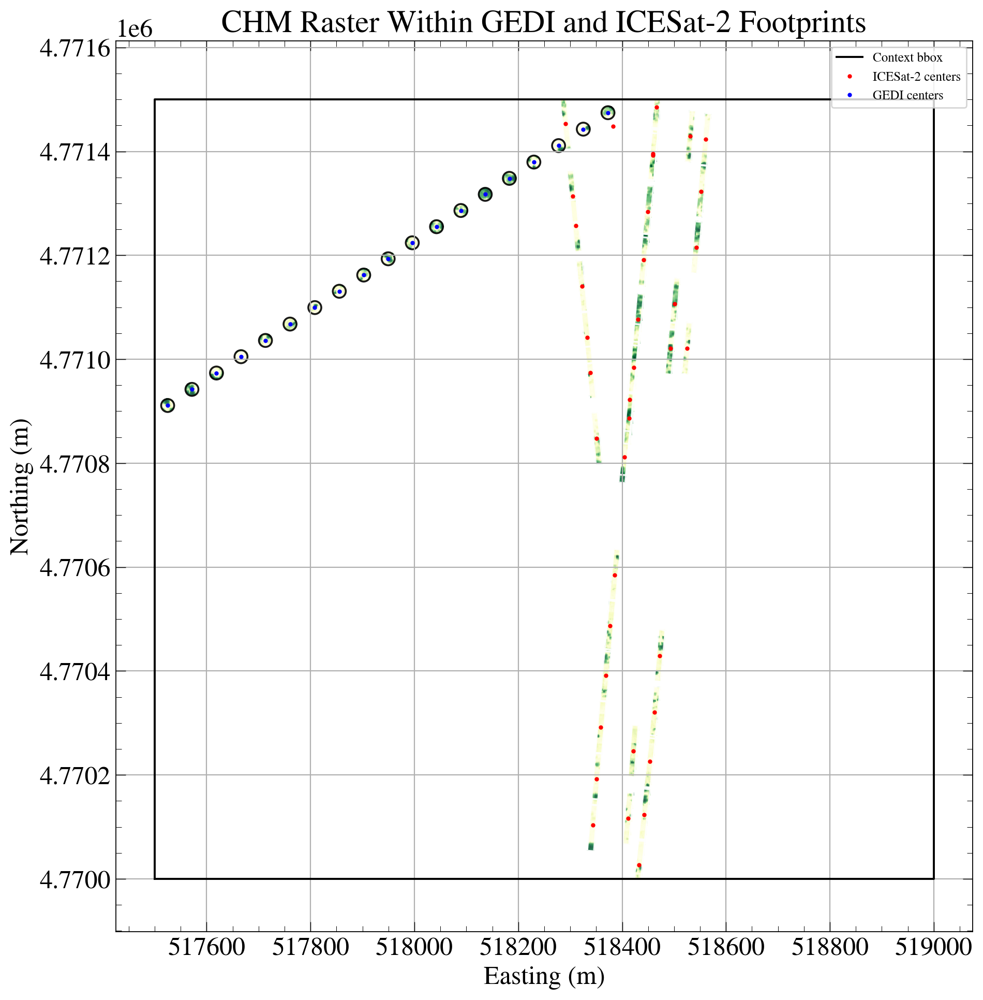

In [44]:
import numpy as np
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon as MplPolygon, Circle
from matplotlib.collections import PatchCollection
import rasterio
from rasterio.mask import mask
import contextily as ctx  # optional; keep if you want the basemap

# -------- Helper: clip & plot CHM inside each geometry (same CRS everywhere) --------
def plot_chm_within_geoms_same_crs(chm_path, geoms_gdf, ax, alpha=0.85, cmap="gray"):
    """
    Assumes: raster CRS == geoms_gdf.crs == plotting CRS.
    For each geometry, clip the raster and imshow it with the correct extent.
    """
    if len(geoms_gdf) == 0:
        return
    with rasterio.open(chm_path) as src:
        for geom in geoms_gdf.geometry:
            if geom is None:
                continue
            try:
                arr, out_transform = mask(src, [geom], crop=True, filled=False)
            except ValueError:
                # geometry outside raster bounds
                continue

            band = arr[0]  # first (and only) band
            if band.count() == 0:
                continue

            # Compute extent directly from out_transform (north-up assumed)
            h, w = band.shape
            a = out_transform.a  # pixel width
            e = out_transform.e  # pixel height (negative)
            c = out_transform.c  # left
            f = out_transform.f  # top
            left, top = c, f
            right = left + a * w
            bottom = top + e * h

            ax.imshow(
                band.filled(np.nan),
                extent=[left, right, bottom, top],
                origin="upper",
                interpolation="none",
                alpha=alpha,
                cmap=cmap  # e.g., "gray" for neutral display
            )

# ===== Build ICESat-2 polygons (unchanged) =====
icesat2_meaned = icesat2_meaned.reset_index(drop=True)
assert len(icesat2_meaned) == xc.shape[0], "Mismatch between df1 rows and segment coordinates"

polygons = []
for i in range(icesat2_meaned.shape[0]):
    if np.any(np.isnan(xc[i])) or np.any(np.isnan(yc[i])):
        polygons.append(None)
        continue
    rect = [(xc[i, j], yc[i, j]) for j in [2, 3, 4, 5]]
    polygons.append(Polygon(rect))

icesat2_segments = gpd.GeoDataFrame(icesat2_meaned.copy(), geometry=polygons, crs=utm_code)

# ===== Build GEDI circular buffers (12.5 m radius) =====
gedi_meaned = gedi_meaned.reset_index(drop=True)
circle_geometries = []
for i in range(gedi_meaned.shape[0]):
    e = gedi_meaned.iloc[i]["Easting"]
    n = gedi_meaned.iloc[i]["Northing"]
    if np.isnan(e) or np.isnan(n):
        circle_geometries.append(None)
    else:
        circle_geometries.append(Point(e, n).buffer(12.5))

gedi_footprints = gpd.GeoDataFrame(gedi_meaned.copy(), geometry=circle_geometries, crs=utm_code)

# ===== Plot =====
fig, ax = plt.subplots(figsize=(10, 10))

# Plot CHM inside footprints 
plot_chm_within_geoms_same_crs(chm_path2, icesat2_segments, ax, alpha=0.85, cmap="YlGn")
plot_chm_within_geoms_same_crs(chm_path2, gedi_footprints,  ax, alpha=0.85, cmap="YlGn")

# 2) Optional context bbox
ax.plot([x_min, x_max, x_max, x_min, x_min],
        [y_min, y_min, y_max, y_max, y_min],
        color="black", linestyle="-", linewidth=1.4, label="Context bbox")

# 3) Neutral outlines for ICESat-2 polygons
patches1 = []
for geom in icesat2_segments.geometry:
    if geom is None:
        continue
    patches1.append(MplPolygon(list(geom.exterior.coords), closed=True))
ax.add_collection(PatchCollection(patches1, facecolor="none", edgecolor="white", linewidths=1.3, alpha=0.9))

# 4) Neutral outlines for GEDI circles
patches2 = []
for geom in gedi_footprints.geometry:
    if geom is None:
        continue
    c = geom.centroid
    patches2.append(Circle((c.x, c.y), radius=12.5))
ax.add_collection(PatchCollection(patches2, facecolor="none", edgecolor="black", linewidths=1.3, alpha=0.9))

# 5) Centers (optional)
ax.plot(icesat2_meaned["Easting"], icesat2_meaned["Northing"], "ro", markersize=2, label="ICESat-2 centers")
ax.plot(gedi_meaned["Easting"],   gedi_meaned["Northing"],   "bo", markersize=2, label="GEDI centers")

# 6) Basemap (optional). If you use it, contextily will reproject under the hood.
# ctx.add_basemap(ax, crs=icesat2_segments.crs, source=ctx.providers.Esri.WorldImagery)

ax.set_aspect("equal")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")
ax.set_title("CHM Raster Within GEDI and ICESat-2 Footprints")
ax.legend(loc="upper right", fontsize=9)
plt.grid(True)
plt.tight_layout()
plt.show()

In [57]:
import numpy as np
import geopandas as gpd
from shapely.geometry import Point, Polygon
import rasterio
from rasterio.mask import mask
import plotly.graph_objects as go

# ---------- CHM clips -> Plotly Heatmap traces ----------
def heatmaps_from_chm(chm_path, geoms_gdf, colorscale="Gray", opacity=0.9):
    """
    For each geometry, clip CHM and return a list of plotly Heatmap traces.
    Assumes raster CRS == geoms_gdf.crs. No colorbar or legend.
    """
    traces = []
    if len(geoms_gdf) == 0:
        return traces

    with rasterio.open(chm_path) as src:
        nodata = src.nodata
        for geom in geoms_gdf.geometry:
            if geom is None:
                continue
            try:
                arr, out_transform = mask(src, [geom], crop=True, filled=True, nodata=nodata)
            except ValueError:
                continue

            z = arr[0].astype("float64")
            if nodata is not None:
                z[z == nodata] = np.nan
            if not np.isfinite(z).any():
                continue

            h, w = z.shape
            a, c, e, f = out_transform.a, out_transform.c, out_transform.e, out_transform.f
            left, top = c, f
            right  = left + a * w
            bottom = top  + e * h  # e negative for north-up
            z_plot = np.flipud(z)

            x = np.linspace(left, right, w)
            y = np.linspace(bottom, top,  h)

            traces.append(
                go.Heatmap(
                    z=z_plot,
                    x=x, y=y,
                    colorscale=colorscale,
                    opacity=opacity,
                    showscale=False,  # no colorbar
                    hoverinfo="skip"
                )
            )
    return traces


# ===== Build ICESat-2 polygons =====
icesat2_meaned = icesat2_meaned.reset_index(drop=True)
assert len(icesat2_meaned) == xc.shape[0], "Mismatch between df1 rows and segment coordinates"

polygons = []
for i in range(icesat2_meaned.shape[0]):
    if np.any(np.isnan(xc[i])) or np.any(np.isnan(yc[i])):
        polygons.append(None)
        continue
    rect = [(xc[i, j], yc[i, j]) for j in [2, 3, 4, 5]]
    polygons.append(Polygon(rect))

icesat2_segments = gpd.GeoDataFrame(icesat2_meaned.copy(), geometry=polygons, crs=utm_code)

# ===== Build GEDI circular buffers (12.5 m radius) =====
gedi_meaned = gedi_meaned.reset_index(drop=True)
circle_geometries = []
for i in range(gedi_meaned.shape[0]):
    e = gedi_meaned.iloc[i]["Easting"]
    n = gedi_meaned.iloc[i]["Northing"]
    if np.isnan(e) or np.isnan(n):
        circle_geometries.append(None)
    else:
        circle_geometries.append(Point(e, n).buffer(12.5))

gedi_footprints = gpd.GeoDataFrame(gedi_meaned.copy(), geometry=circle_geometries, crs=utm_code)

# ===== Create Plotly figure =====
fig = go.Figure()

# 1) Add CHM clips
for t in heatmaps_from_chm(chm_path2, icesat2_segments, colorscale="YlGn", opacity=0.9):
    fig.add_trace(t)
for t in heatmaps_from_chm(chm_path2, gedi_footprints, colorscale="YlGn", opacity=0.9):
    fig.add_trace(t)

# 2) Optional context bbox
fig.add_trace(
    go.Scatter(
        x=[x_min, x_max, x_max, x_min, x_min],
        y=[y_min, y_min, y_max, y_max, y_min],
        mode="lines",
        line=dict(color="black", width=1.4),
        showlegend=False,
        hoverinfo="skip"
    )
)

# 3) ICESat-2 polygon outlines
for geom in icesat2_segments.geometry:
    if geom is None: continue
    xs, ys = geom.exterior.xy
    fig.add_trace(
        go.Scatter(
            x=np.asarray(xs), y=np.asarray(ys),
            mode="lines",
            line=dict(color="white", width=1.3),
            showlegend=False,
            hoverinfo="skip"
        )
    )

# 4) GEDI circle outlines
theta = np.linspace(0, 2*np.pi, 181)
for geom in gedi_footprints.geometry:
    if geom is None: continue
    c = geom.centroid
    r = 12.5
    xs = c.x + r * np.cos(theta)
    ys = c.y + r * np.sin(theta)
    fig.add_trace(
        go.Scatter(
            x=xs, y=ys,
            mode="lines",
            line=dict(color="black", width=1.3),
            showlegend=False,
            hoverinfo="skip"
        )
    )

# 5) Centers (optional)
fig.add_trace(
    go.Scatter(
        x=icesat2_meaned["Easting"], y=icesat2_meaned["Northing"],
        mode="markers",
        marker=dict(color="red", size=3),
        showlegend=False,
        hoverinfo="skip"
    )
)
fig.add_trace(
    go.Scatter(
        x=gedi_meaned["Easting"], y=gedi_meaned["Northing"],
        mode="markers",
        marker=dict(color="blue", size=3),
        showlegend=False,
        hoverinfo="skip"
    )
)

# ===== Layout =====
fig.update_layout(
    title="CHM Raster Within GEDI and ICESat-2 Footprints",
    xaxis_title="Easting (m)",
    yaxis_title="Northing (m)",
    template="plotly_white",
    width=800,      # width and height set equal for a square figure
    height=800,
    margin=dict(l=50, r=50, t=80, b=50),
    showlegend=False
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)  # enforce square axes
fig.update_xaxes(showgrid=True, zeroline=False)
fig.update_yaxes(showgrid=True, zeroline=False)

fig.show()


# The End!!!